In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px

file_path = ['dataset/2021-plu-total-hab-data.csv',
              'dataset/2022-plu-total-hab-data.csv',
              'dataset/2023-plu-total-hab-data.csv',
              'dataset/2024-plu-total-hab-data.csv']

merged_df = pd.concat([pd.read_csv(file) for file in file_path])

merged_df.to_csv('dataset/merged_df.csv', index=False)

**Informe de Calidad de los Datos**: Un informe detallado sobre la calidad de los datos, incluyendo los problemas identificados y las acciones tomadas para mejorarlos (tratamiento de valores faltantes, inconsistencias, etc.).

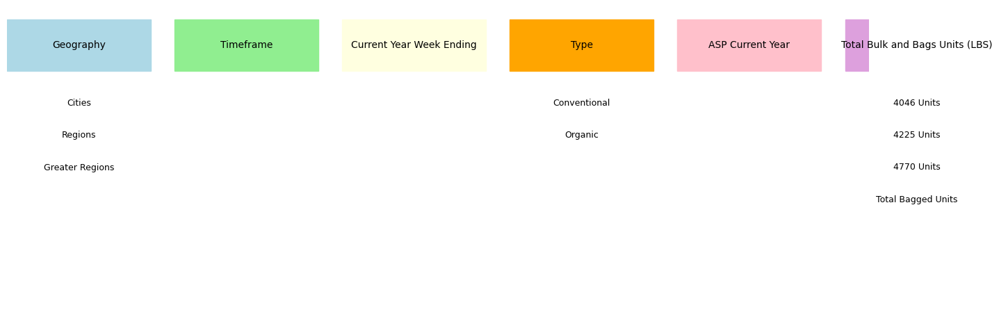

In [3]:
# Create a figure for the diagram
fig, ax = plt.subplots(figsize=(16, 6))
ax.set_xlim(0, 18)
ax.set_ylim(0, 5)


# Draw the main categories
ax.add_patch(mpatches.Rectangle((0, 4), 3, 0.8, color="lightblue"))
ax.text(1.5, 4.4, "Geography", ha="center", va="center", fontsize=10)


# Add smaller boxes for subcategories of geography in vertical layout
x_center = 1.5
y_positions = [3, 2.5, 2]
subcategories = ["Cities", "Regions", "Greater Regions"]
for i, (y, label) in enumerate(zip(y_positions, subcategories)):
    ax.text(x_center, y + 0.5, label, ha="center", va="center", fontsize=9)


ax.add_patch(mpatches.Rectangle((3.5, 4), 3, 0.8, color="lightgreen"))
ax.text(5, 4.4, "Timeframe", ha="center", va="center", fontsize=10)


ax.add_patch(mpatches.Rectangle((7, 4), 3, 0.8, color="lightyellow"))
ax.text(8.5, 4.4, "Current Year Week Ending", ha="center", va="center", fontsize=10)


ax.add_patch(mpatches.Rectangle((10.5, 4), 3, 0.8, color="orange"))
ax.text(12, 4.4, "Type", ha="center", va="center", fontsize=10)

# Add subcategories for Type in vertical layout
ax.add_patch(mpatches.Rectangle((2, 7), 6, 0.6, color="lightcoral"))
ax.text(12, 3.5, "Conventional", ha="center", va="center", fontsize=9)
ax.add_patch(mpatches.Rectangle((2, 6.2), 6, 0.6, color="lightcoral"))
ax.text(12, 3, "Organic", ha="center", va="center", fontsize=9)


ax.add_patch(mpatches.Rectangle((14, 4), 3, 0.8, color="pink"))
ax.text(15.5, 4.4, "ASP Current Year", ha="center", va="center", fontsize=10)


# Add the Total Bulk and Bags Units category
ax.add_patch(mpatches.Rectangle((17.5, 4), 3, 0.8, color="plum"))
ax.text(19, 4.4, "Total Bulk and Bags Units (LBS)", ha="center", va="center", fontsize=10)

# Add smaller boxes for subcategories of Total Bulk and Bags Units in vertical layout
x_center = 19
y_positions = [3, 2.5, 2, 1.5]
subcategories = ["4046 Units", "4225 Units", "4770 Units", "Total Bagged Units"]
for i, (y, label) in enumerate(zip(y_positions, subcategories)):
    ax.text(x_center, y + 0.5, label, ha="center", va="center", fontsize=9)


# Remove axis for a cleaner look
ax.axis('off')

# Show the diagram
plt.show()

- Análisis de Calidad de los Datos: Evaluar la calidad de los datos, identificando problemas como valores faltantes, inconsistencias, errores o duplicados. (Hacer un mapa de calor de los datos y consultar en HASS si los valores faltantes se explican)

In [4]:
merged_df = pd.read_csv('dataset/merged_df.csv')
suppliers_df = pd.read_csv('dataset/merged_suppliers.csv')

In [5]:
plt.figure(figsize=(10, 8))
fig1 = px.imshow(merged_df.isnull(),
    color_continuous_scale=['black','red'],
    labels=dict(color="NaN"),
    title="Valores perdidos para avocado")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

<Figure size 1000x800 with 0 Axes>

In [6]:
# Convert the 'Current Year Week Ending' column to datetime if not already done
merged_df['Current Year Week Ending'] = pd.to_datetime(merged_df['Current Year Week Ending'], errors='coerce')

# Filter the records for October, November, and December of 2021, 2022, 2023, and 2024
oct_nov_dec_records = merged_df[
    ((merged_df['Current Year Week Ending'].dt.month >= 10) & 
     (merged_df['Current Year Week Ending'].dt.month <= 12)) & 
    (merged_df['Current Year Week Ending'].dt.year.isin([2021, 2022, 2023, 2024]))
]

# Calculate the mean for the specified columns by month, grouped by geography and type of avocado
monthly_mean = oct_nov_dec_records.groupby([
    oct_nov_dec_records['Current Year Week Ending'].dt.to_period('M'), 
    'Geography', 
    'Type'
])[['ASP Current Year', 'Total Bulk and Bags Units', '4046 Units', '4225 Units', '4770 Units', 'TotalBagged Units']].mean().reset_index()

# Define the new Current Year Week Ending dates
new_dates = pd.to_datetime([
    '2024-11-10 00:00:00', '2024-11-17 00:00:00', '2024-11-24 00:00:00',
    '2024-12-01 00:00:00', '2024-12-08 00:00:00', '2024-12-15 00:00:00',
    '2024-12-22 00:00:00', '2024-12-29 00:00:00'
])

# Filter the monthly_mean DataFrame for records from 2024-11
filtered_monthly_mean = monthly_mean[monthly_mean['Current Year Week Ending'].dt.to_timestamp() >= '2024-11']

# Create an empty list to store the new records
new_records = []

# Iterate over each row in filtered_monthly_mean
for _, row in filtered_monthly_mean.iterrows():
    for date in new_dates:
        new_record = {
            'Geography': row['Geography'],
            'Timeframe': 'Weekly',
            'Current Year Week Ending': date,
            'Type': row['Type'],
            'ASP Current Year': row['ASP Current Year'],
            'Total Bulk and Bags Units': row['Total Bulk and Bags Units'],
            '4046 Units': row['4046 Units'],
            '4225 Units': row['4225 Units'],
            '4770 Units': row['4770 Units'],
            'TotalBagged Units': row['TotalBagged Units']
        }
        new_records.append(new_record)

# Create a DataFrame from the new records
proyeccion_df = pd.DataFrame(new_records)
proyeccion_df.to_csv('dataset/proyeccion_df.csv', index=False)

# Merge merged_df and proyeccion_df
avocado_df = pd.concat([merged_df, proyeccion_df], ignore_index=True)

avocado_df.to_csv('dataset/avocado_df.csv', index=False)

plt.figure(figsize=(10, 8))
fig1 = px.imshow(avocado_df.isnull(),
    color_continuous_scale=['black','red'],
    labels=dict(color="NaN"),
    title="Valores perdidos para avocado")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()


C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2514968760.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



<Figure size 1000x800 with 0 Axes>

In [7]:
avocado_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24536 entries, 0 to 24535
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Geography                  24536 non-null  object        
 1   Timeframe                  24536 non-null  object        
 2   Current Year Week Ending   24536 non-null  datetime64[ns]
 3   Type                       24536 non-null  object        
 4   ASP Current Year           24536 non-null  float64       
 5   Total Bulk and Bags Units  24536 non-null  float64       
 6   4046 Units                 24536 non-null  float64       
 7   4225 Units                 24536 non-null  float64       
 8   4770 Units                 24536 non-null  float64       
 9   TotalBagged Units          24536 non-null  float64       
 10  SmlBagged Units            0 non-null      float64       
 11  LrgBagged Units            0 non-null      float64       
 12  X-Lr

In [8]:
plt.figure(figsize=(10, 8))
fig1 = px.imshow(suppliers_df.isnull(),
    color_continuous_scale=['black','red'],
    labels=dict(color="NaN"),
    title="Valores perdidos para suppliers")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

<Figure size 1000x800 with 0 Axes>

In [9]:
avocado_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24536 entries, 0 to 24535
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Geography                  24536 non-null  object        
 1   Timeframe                  24536 non-null  object        
 2   Current Year Week Ending   24536 non-null  datetime64[ns]
 3   Type                       24536 non-null  object        
 4   ASP Current Year           24536 non-null  float64       
 5   Total Bulk and Bags Units  24536 non-null  float64       
 6   4046 Units                 24536 non-null  float64       
 7   4225 Units                 24536 non-null  float64       
 8   4770 Units                 24536 non-null  float64       
 9   TotalBagged Units          24536 non-null  float64       
 10  SmlBagged Units            0 non-null      float64       
 11  LrgBagged Units            0 non-null      float64       
 12  X-Lr

In [10]:
avocado_df.describe()

,Current Year Week Ending,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,SmlBagged Units,LrgBagged Units,X-LrgBagged Units
count,24536,24536.000000,2.453600e+04,2.453600e+04,2.453600e+04,2.453600e+04,2.453600e+04,0.0,0.0,0.0
mean,2023-01-04 07:31:54.444082176,1.340299,1.018375e+06,4.666806e+05,2.118439e+05,2.820130e+04,3.116492e+05,NaN,NaN,NaN
min,2021-01-11 00:00:00,0.607247,2.676100e+03,0.000000e+00,0.000000e+00,0.000000e+00,1.251590e+03,NaN,NaN,NaN
25%,2022-01-02 00:00:00,1.085036,2.986215e+04,1.100915e+03,3.036040e+03,0.000000e+00,1.970305e+04,NaN,NaN,NaN
50%,2023-01-01 00:00:00,1.298635,1.631951e+05,4.483338e+04,2.107037e+04,4.044000e+01,6.358574e+04,NaN,NaN,NaN
75%,2023-12-31 00:00:00,1.539138,5.349558e+05,2.341009e+05,9.939701e+04,3.088970e+03,1.801099e+05,NaN,NaN,NaN
max,2024-12-29 00:00:00,3.179988,6.034646e+07,3.113597e+07,1.810590e+07,2.801180e+06,1.544625e+07,NaN,NaN,NaN
std,NaN,0.334727,4.063736e+06,1.968989e+06,9.026263e+05,1.421914e+05,1.149713e+06,NaN,NaN,NaN


In [11]:
avocado_df.count()

Geography                    24536
Timeframe                    24536
Current Year Week Ending     24536
Type                         24536
ASP Current Year             24536
Total Bulk and Bags Units    24536
4046 Units                   24536
4225 Units                   24536
4770 Units                   24536
TotalBagged Units            24536
SmlBagged Units                  0
LrgBagged Units                  0
X-LrgBagged Units                0
dtype: int64

In [12]:
unique_values = avocado_df.nunique()
unique_values

Geography                       59
Timeframe                        1
Current Year Week Ending       208
Type                             2
ASP Current Year             23586
Total Bulk and Bags Units    23579
4046 Units                   23348
4225 Units                   23160
4770 Units                   13313
TotalBagged Units            23571
SmlBagged Units                  0
LrgBagged Units                  0
X-LrgBagged Units                0
dtype: int64

In [13]:
print(avocado_df['Geography'].unique())

['Albany' 'Atlanta' 'Baltimore/Washington' 'Birmingham/Montgomery' 'Boise'
 'Boston' 'Buffalo/Rochester' 'Charlotte' 'Chicago' 'Cincinnati/Dayton'
 'Columbus' 'Dallas/Ft. Worth' 'Denver' 'Detroit' 'Grand Rapids'
 'Harrisburg/Scranton' 'Hartford/Springfield' 'Houston' 'Indianapolis'
 'Jacksonville' 'Las Vegas' 'Los Angeles' 'Louisville'
 'Miami/Ft. Lauderdale' 'Nashville' 'Northern New England'
 'New Orleans/Mobile' 'New York' 'Orlando' 'Peoria/Springfield'
 'Philadelphia' 'Phoenix/Tucson' 'Pittsburgh' 'Portland' 'Providence'
 'Raleigh/Greensboro' 'Richmond/Norfolk' 'Roanoke' 'Sacramento'
 'San Diego' 'San Francisco' 'Seattle' 'South Carolina' 'Spokane'
 'St. Louis' 'Syracuse' 'Tampa' 'Toledo' 'West Tex/New Mexico' 'Wichita'
 'California' 'Great Lakes' 'Midsouth' 'Northeast' 'Plains'
 'South Central' 'Southeast' 'West' 'Total U.S.']


In [14]:
avocado_df.head()

,Geography,Timeframe,Current Year Week Ending,Type,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,SmlBagged Units,LrgBagged Units,X-LrgBagged Units
0,Albany,Weekly,2021-01-11,Conventional,1.194755,150112.17,17074.48,100955.99,39.59,32042.12,NaN,NaN,NaN
1,Atlanta,Weekly,2021-01-11,Conventional,0.812573,892386.79,542057.87,146831.96,32.11,203464.85,NaN,NaN,NaN
2,Baltimore/Washington,Weekly,2021-01-11,Conventional,1.073194,1203423.07,402341.66,365970.12,2939.24,432172.05,NaN,NaN,NaN
3,Birmingham/Montgomery,Weekly,2021-01-11,Conventional,0.757310,402306.65,263020.12,17855.75,10.39,121420.38,NaN,NaN,NaN
4,Boise,Weekly,2021-01-11,Conventional,1.033496,138962.53,57581.95,34044.86,15334.98,32000.74,NaN,NaN,NaN


In [15]:
cities = ['Albany', 'Atlanta', 'Boise', 'Boston', 'Charlotte', 'Chicago', 'Columbus', 
          'Denver', 'Detroit', 'Grand Rapids', 'Houston', 'Indianapolis', 'Jacksonville', 
          'Las Vegas', 'Los Angeles', 'Louisville', 'Nashville', 'New York', 'Orlando', 
          'Philadelphia', 'Pittsburgh', 'Providence', 'Portland', 'Roanoke', 'Sacramento', 
          'San Diego', 'San Francisco', 'Seattle', 'Spokane', 'St. Louis', 'Syracuse', 
          'Tampa', 'Toledo', 'Wichita']

regions = ['Baltimore/Washington', 'Birmingham/Montgomery', 'Buffalo/Rochester', 
           'Cincinnati/Dayton', 'Dallas/Ft. Worth', 'Harrisburg/Scranton', 
           'Hartford/Springfield', 'Miami/Ft. Lauderdale', 'New Orleans/Mobile', 
           'Northern New England', 'Peoria/Springfield', 'Phoenix/Tucson', 
           'Raleigh/Greensboro', 'Richmond/Norfolk', 'South Carolina', 'West Tex/New Mexico']

greaterregions = ['California', 'Great Lakes', 'Midsouth', 'Northeast', 'Plains', 
                  'South Central', 'Southeast', 'West']

In [16]:
filtered_df_greaterregions = avocado_df[avocado_df['Geography'].isin(greaterregions)]

filtered_df_greaterregions.head()

,Geography,Timeframe,Current Year Week Ending,Type,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,SmlBagged Units,LrgBagged Units,X-LrgBagged Units
50,California,Weekly,2021-01-11,Conventional,1.092303,7305333.58,2845001.28,2152753.34,959794.53,1347784.44,NaN,NaN,NaN
51,Great Lakes,Weekly,2021-01-11,Conventional,0.909006,5245629.02,2154802.80,1508395.12,372998.01,1209433.08,NaN,NaN,NaN
52,Midsouth,Weekly,2021-01-11,Conventional,0.904031,4935644.59,2239861.89,1133848.51,13977.19,1547957.00,NaN,NaN,NaN
53,Northeast,Weekly,2021-01-11,Conventional,1.074509,6586438.02,1046371.60,3486564.63,7295.55,2046206.24,NaN,NaN,NaN
54,Plains,Weekly,2021-01-11,Conventional,0.853520,2605939.78,1279482.18,560207.22,3575.90,762674.48,NaN,NaN,NaN


In [17]:
file_paths = ['dataset/Volume Hass Avocado Board Suppliers 2022.csv',
              'dataset/Volume Hass Avocado Board Suppliers 2023.csv',
              'dataset/Volume Hass Avocado Board Suppliers 2024.csv',
              'dataset/Volume Hass Avocado Board Suppliers 2025 (projection).csv']

suppliers_df = pd.concat([pd.read_csv(file) for file in file_paths])

suppliers_df.to_csv('dataset/merged_suppliers.csv', index=False)

print(suppliers_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 208 entries, 0 to 51
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Week Ending         208 non-null    object
 1   Year                208 non-null    int64 
 2   Status              208 non-null    object
 3   Total Volume        208 non-null    object
 4   California          208 non-null    object
 5   Chile               208 non-null    object
 6   Mexico              182 non-null    object
 7   Peru                208 non-null    object
 8   Colombia            208 non-null    object
 9   Dominican Republic  156 non-null    object
dtypes: int64(1), object(9)
memory usage: 17.9+ KB
None


In [18]:
#Univardiado

In [19]:
# Filtrar los datos para California
california_data = merged_df[merged_df['Geography'] == 'California']

# Verificar el tamaño del dataset filtrado
print("\nTamaño del dataset para California:")
print(california_data.shape)



Tamaño del dataset para California:
(400, 13)


In [20]:
# Verificar valores nulos
print("\nValores nulos por columna:")
print(california_data.isnull().sum())



Valores nulos por columna:
Geography                      0
Timeframe                      0
Current Year Week Ending       0
Type                           0
ASP Current Year               0
Total Bulk and Bags Units      0
4046 Units                     0
4225 Units                     0
4770 Units                     0
TotalBagged Units              0
SmlBagged Units              400
LrgBagged Units              400
X-LrgBagged Units            400
dtype: int64



Análisis univariado de la variable: Total Bulk and Bags Units
count    4.000000e+02
mean     3.304374e+06
std      2.984602e+06
min      2.783309e+05
25%      3.540552e+05
50%      2.560185e+06
75%      6.245432e+06
max      9.709444e+06
Name: Total Bulk and Bags Units, dtype: float64


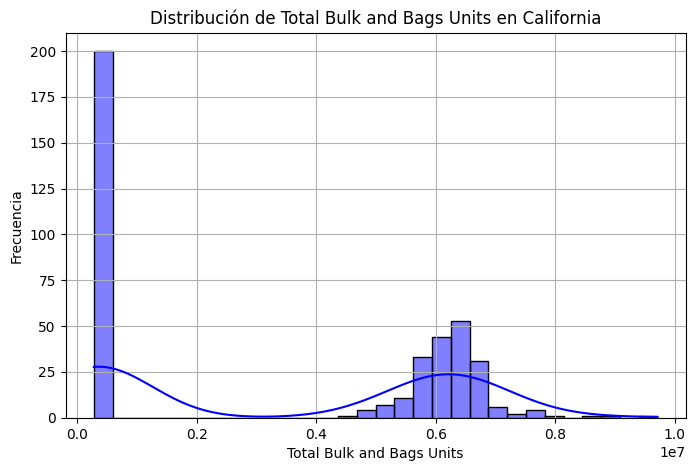

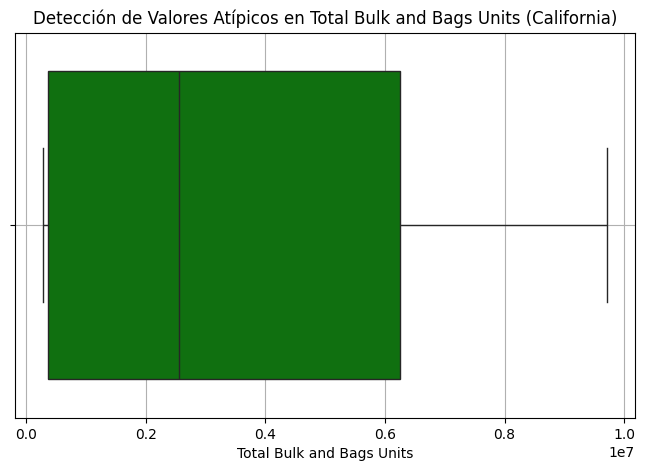

In [21]:
# Análisis univariado: Total Bulk and Bags Units
variable = 'Total Bulk and Bags Units'

print(f"\nAnálisis univariado de la variable: {variable}")
print(california_data[variable].describe())

# Histograma
plt.figure(figsize=(8, 5))
sns.histplot(california_data[variable], kde=True, bins=30, color='blue')
plt.title(f'Distribución de {variable} en California')
plt.xlabel(variable)
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

# Boxplot para detectar valores atípicos
plt.figure(figsize=(8, 5))
sns.boxplot(x=california_data[variable], color='green')
plt.title(f'Detección de Valores Atípicos en {variable} (California)')
plt.xlabel(variable)
plt.grid(True)
plt.show()

Límite inferior: -8483010.1975
Límite superior: 15082497.5425
Número de outliers: 0

Ejemplos de valores atípicos:
Empty DataFrame
Columns: [Current Year Week Ending, Total Bulk and Bags Units]
Index: []


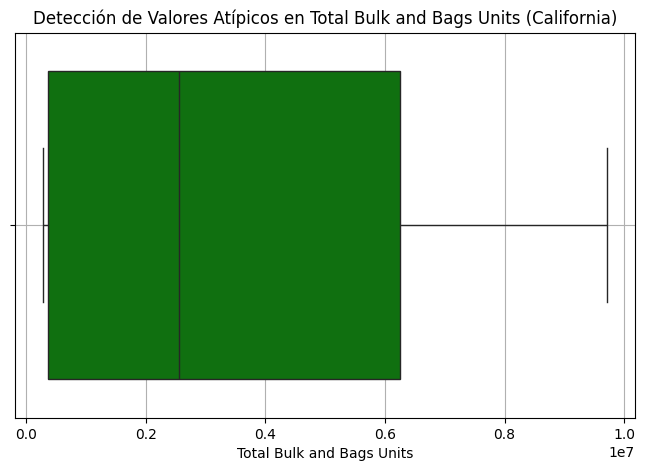

In [22]:
# Calcular cuartiles
Q1 = california_data['Total Bulk and Bags Units'].quantile(0.25)
Q3 = california_data['Total Bulk and Bags Units'].quantile(0.75)
IQR = Q3 - Q1

# Calcular los límites de outliers
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Identificar outliers
outliers = california_data[(california_data['Total Bulk and Bags Units'] < lower_limit) |
                            (california_data['Total Bulk and Bags Units'] > upper_limit)]

# Resultados
print(f"Límite inferior: {lower_limit}")
print(f"Límite superior: {upper_limit}")
print(f"Número de outliers: {len(outliers)}")

# Mostrar algunos outliers
print("\nEjemplos de valores atípicos:")
print(outliers[['Current Year Week Ending', 'Total Bulk and Bags Units']].head())

# Visualizar los outliers en el contexto del boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x=california_data['Total Bulk and Bags Units'], color='green')
plt.title('Detección de Valores Atípicos en Total Bulk and Bags Units (California)')
plt.xlabel('Total Bulk and Bags Units')
plt.grid(True)
plt.show()


In [23]:
print(california_data.columns)

Index(['Geography', 'Timeframe', 'Current Year Week Ending', 'Type',
       'ASP Current Year', 'Total Bulk and Bags Units', '4046 Units',
       '4225 Units', '4770 Units', 'TotalBagged Units', 'SmlBagged Units',
       'LrgBagged Units', 'X-LrgBagged Units'],
      dtype='object')


In [24]:
print(california_data[['4046 Units', '4225 Units', '4770 Units']].isnull().sum())

4046 Units    0
4225 Units    0
4770 Units    0
dtype: int64


In [25]:
california_data = california_data.dropna(subset=['4046 Units', '4225 Units', '4770 Units'])

In [26]:
california_data['4046 Units'] = pd.to_numeric(california_data['4046 Units'], errors='coerce')
california_data['4225 Units'] = pd.to_numeric(california_data['4225 Units'], errors='coerce')
california_data['4770 Units'] = pd.to_numeric(california_data['4770 Units'], errors='coerce')


In [27]:
print(california_data.shape)

(400, 13)


4046 Units    0
4225 Units    0
4770 Units    0
dtype: int64

Análisis de la columna: 4046 Units
Límite inferior: -4724400.016249999
Límite superior: 8207741.5337499995
Número de outliers: 0

Ejemplos de valores atípicos:
Empty DataFrame
Columns: [Current Year Week Ending, 4046 Units]
Index: []


C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\3121228200.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\3121228200.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\3121228200.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

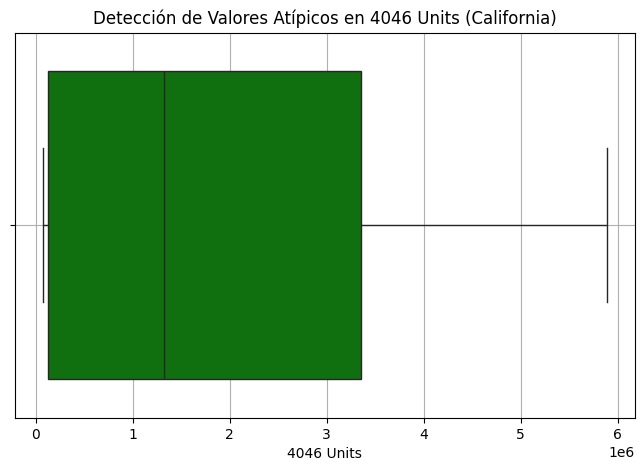


Análisis de la columna: 4225 Units
Límite inferior: -842912.9762500001
Límite superior: 1459660.13375
Número de outliers: 33

Ejemplos de valores atípicos:
    Current Year Week Ending  4225 Units
50                2021-01-11  2152753.34
168               2021-01-17  1808634.60
286               2021-01-24  1986436.74
404               2021-01-31  1939590.71
522               2021-02-07  2544885.37


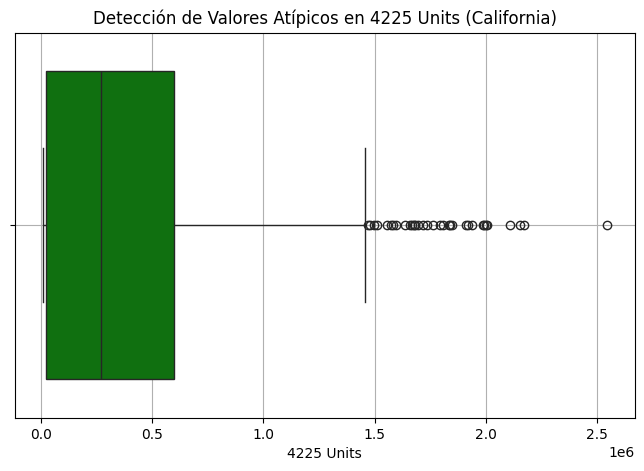


Análisis de la columna: 4770 Units
Límite inferior: -897974.7650000001
Límite superior: 1496657.5150000001
Número de outliers: 1

Ejemplos de valores atípicos:
      Current Year Week Ending  4770 Units
12912               2023-02-12  1559808.13


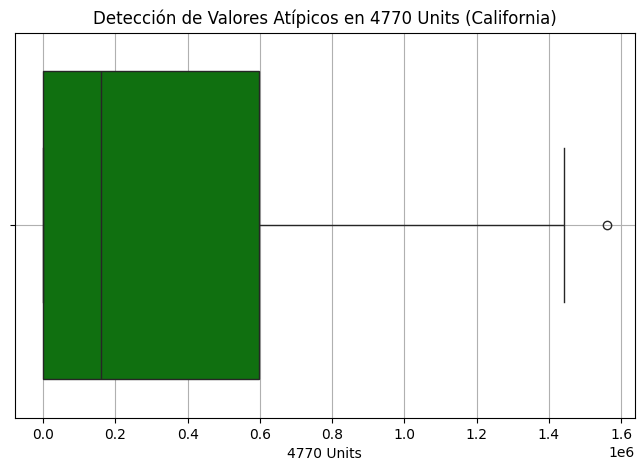

In [28]:
# Filtrar los datos para California
california_data = merged_df[merged_df['Geography'] == 'California']

# Asegurarse de que las columnas que analizaremos son numéricas
california_data['4046 Units'] = pd.to_numeric(california_data['4046 Units'], errors='coerce')
california_data['4225 Units'] = pd.to_numeric(california_data['4225 Units'], errors='coerce')
california_data['4770 Units'] = pd.to_numeric(california_data['4770 Units'], errors='coerce')

# Verificar la cantidad de valores faltantes
print(california_data[['4046 Units', '4225 Units', '4770 Units']].isnull().sum())

# Eliminar filas con NaN en las columnas de interés
california_data = california_data.dropna(subset=['4046 Units', '4225 Units', '4770 Units'])

# Lista de columnas a analizar
columns_to_analyze = ['4046 Units', '4225 Units', '4770 Units']

# Iterar sobre las columnas para calcular los outliers
for column in columns_to_analyze:
    # Calcular cuartiles
    Q1 = california_data[column].quantile(0.25)
    Q3 = california_data[column].quantile(0.75)
    IQR = Q3 - Q1

    # Calcular los límites de outliers
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Identificar outliers
    outliers = california_data[(california_data[column] < lower_limit) | 
                               (california_data[column] > upper_limit)]

    # Resultados
    print(f"\nAnálisis de la columna: {column}")
    print(f"Límite inferior: {lower_limit}")
    print(f"Límite superior: {upper_limit}")
    print(f"Número de outliers: {len(outliers)}")

    # Mostrar algunos outliers
    print("\nEjemplos de valores atípicos:")
    print(outliers[['Current Year Week Ending', column]].head())

    # Visualizar los outliers en el contexto del boxplot
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=california_data[column], color='green')
    plt.title(f'Detección de Valores Atípicos en {column} (California)')
    plt.xlabel(column)
    plt.grid(True)
    plt.show()


In [29]:
# Lista de columnas a analizar
columns_to_analyze = ['4046 Units', '4225 Units', '4770 Units']

# Iterar sobre las columnas para obtener estadísticas de los outliers
for column in columns_to_analyze:
    # Calcular cuartiles
    Q1 = california_data[column].quantile(0.25)
    Q3 = california_data[column].quantile(0.75)
    IQR = Q3 - Q1

    # Calcular los límites de outliers
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Identificar outliers
    outliers = california_data[(california_data[column] < lower_limit) | 
                               (california_data[column] > upper_limit)]

    # Estadísticas descriptivas de los outliers
    print(f"\nAnálisis de los outliers para la columna {column}:")
    print(outliers[['Current Year Week Ending', column]].describe())




Análisis de los outliers para la columna 4046 Units:
      Current Year Week Ending  4046 Units
count                        0         0.0
mean                       NaT         NaN
min                        NaT         NaN
25%                        NaT         NaN
50%                        NaT         NaN
75%                        NaT         NaN
max                        NaT         NaN
std                        NaN         NaN

Análisis de los outliers para la columna 4225 Units:
            Current Year Week Ending    4225 Units
count                             33  3.300000e+01
mean   2021-05-24 07:16:21.818181888  1.799437e+06
min              2021-01-11 00:00:00  1.470575e+06
25%              2021-03-07 00:00:00  1.637963e+06
50%              2021-05-09 00:00:00  1.761722e+06
75%              2021-07-25 00:00:00  1.939591e+06
max              2022-02-13 00:00:00  2.544885e+06
std                              NaN  2.383976e+05

Análisis de los outliers para la columna 4770

In [30]:
# Comparar estadísticas de datos no atípicos
for column in columns_to_analyze:
    # Datos no atípicos
    non_outliers = california_data[~california_data.index.isin(outliers.index)]

    # Estadísticas descriptivas de los datos no atípicos
    print(f"\nEstadísticas de los datos no atípicos para {column}:")
    print(non_outliers[['Current Year Week Ending', column]].describe())





Estadísticas de los datos no atípicos para 4046 Units:
            Current Year Week Ending    4046 Units
count                            399  3.990000e+02
mean   2022-12-07 08:28:52.330827008  1.752917e+06
min              2021-01-11 00:00:00  7.748182e+04
25%              2021-12-22 12:00:00  1.251328e+05
50%              2022-12-04 00:00:00  3.564369e+05
75%              2023-11-22 12:00:00  3.348820e+06
max              2024-11-03 00:00:00  5.885638e+06
std                              NaN  1.691885e+06

Estadísticas de los datos no atípicos para 4225 Units:
            Current Year Week Ending    4225 Units
count                            399  3.990000e+02
mean   2022-12-07 08:28:52.330827008  4.480214e+05
min              2021-01-11 00:00:00  7.823030e+03
25%              2021-12-22 12:00:00  2.047125e+04
50%              2022-12-04 00:00:00  2.184158e+05
75%              2023-11-22 12:00:00  5.957557e+05
max              2024-11-03 00:00:00  2.544885e+06
std                  

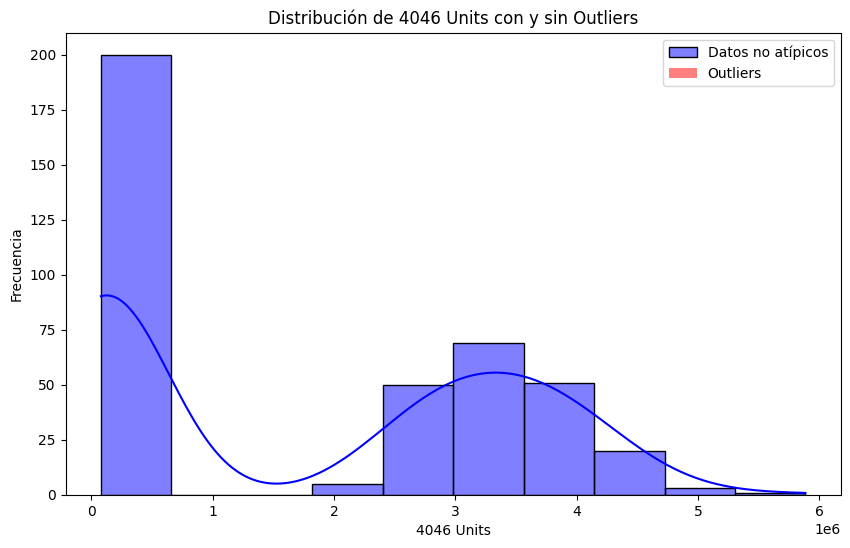

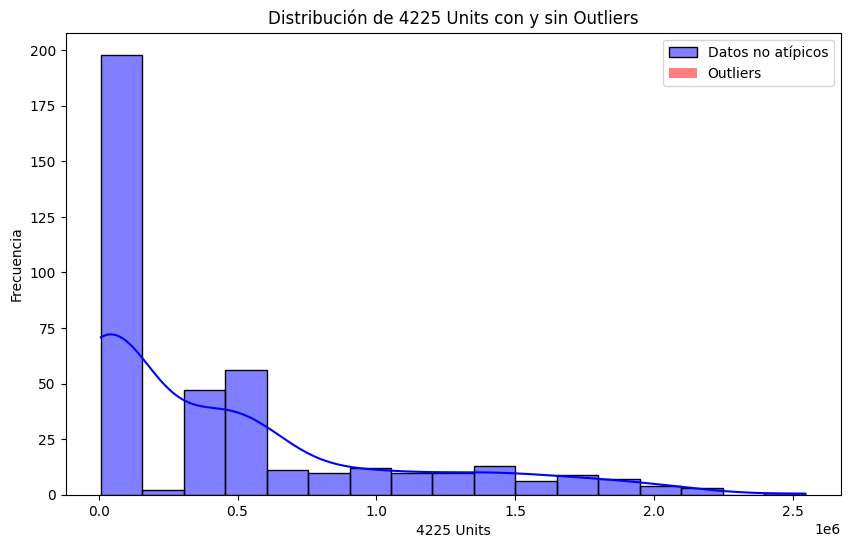

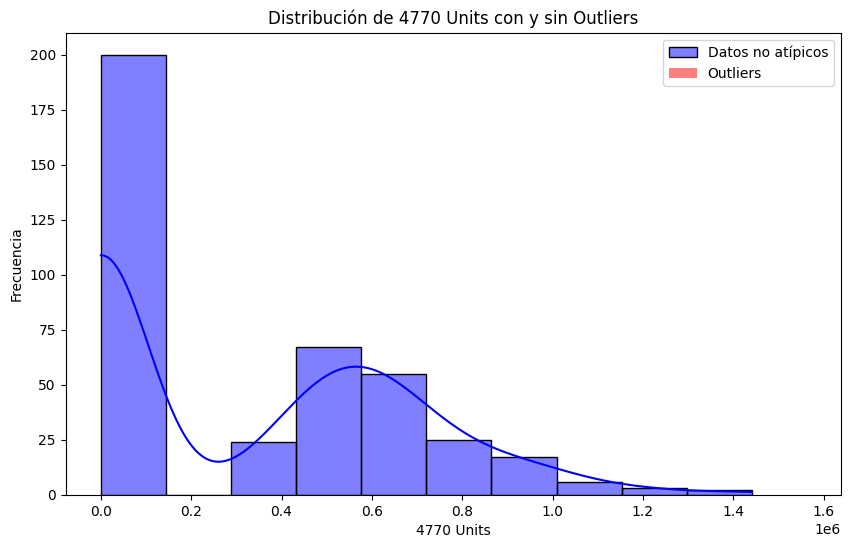

In [31]:
# Visualización de la distribución con y sin outliers
for column in columns_to_analyze:
    plt.figure(figsize=(10, 6))
    sns.histplot(non_outliers[column], kde=True, color='blue', label='Datos no atípicos')
    sns.histplot(outliers[column], kde=True, color='red', label='Outliers')
    plt.legend()
    plt.title(f"Distribución de {column} con y sin Outliers")
    plt.xlabel(column)
    plt.ylabel('Frecuencia')
    plt.show()



In [32]:
# Comparar media y desviación estándar con y sin outliers
for column in columns_to_analyze:
    # Datos no atípicos
    non_outliers = california_data[~california_data.index.isin(outliers.index)]

    # Media y desviación estándar de los datos sin outliers
    mean_non_outliers = non_outliers[column].mean()
    std_non_outliers = non_outliers[column].std()

    # Media y desviación estándar de todos los datos (con outliers)
    mean_all = california_data[column].mean()
    std_all = california_data[column].std()

    print(f"\nImpacto en la media y desviación estándar para {column}:")
    print(f"Media sin outliers: {mean_non_outliers:.2f}")
    print(f"Desviación estándar sin outliers: {std_non_outliers:.2f}")
    print(f"Media con outliers: {mean_all:.2f}")
    print(f"Desviación estándar con outliers: {std_all:.2f}")




Impacto en la media y desviación estándar para 4046 Units:
Media sin outliers: 1752917.37
Desviación estándar sin outliers: 1691884.99
Media con outliers: 1759316.45
Desviación estándar con outliers: 1694603.20

Impacto en la media y desviación estándar para 4225 Units:
Media sin outliers: 448021.43
Desviación estándar sin outliers: 557549.88
Media con outliers: 448599.04
Desviación estándar con outliers: 556970.58

Impacto en la media y desviación estándar para 4770 Units:
Media sin outliers: 319646.33
Desviación estándar sin outliers: 350079.30
Media con outliers: 322746.73
Desviación estándar con outliers: 355096.27


C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2403662005.py:4: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2403662005.py:4: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2403662005.py:4: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.



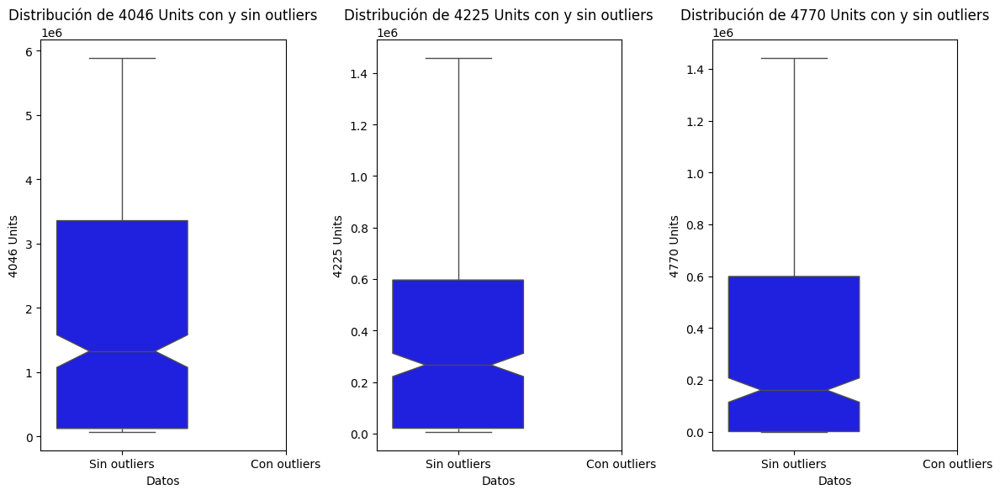

In [33]:
plt.figure(figsize=(12, 6))
for i, column in enumerate(columns_to_analyze):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(data=[non_outliers[column], california_data[column]], 
                palette=["blue", "green"], 
                showfliers=False, 
                notch=True)
    plt.xticks([0, 1], ['Sin outliers', 'Con outliers'])
    plt.title(f"Distribución de {column} con y sin outliers")
    plt.xlabel('Datos')
    plt.ylabel(column)
plt.tight_layout()
plt.show()





C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2403662005.py:4: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2403662005.py:4: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\2403662005.py:4: UserWarning:

The palette list has more values (2) than needed (1), which may not be intended.



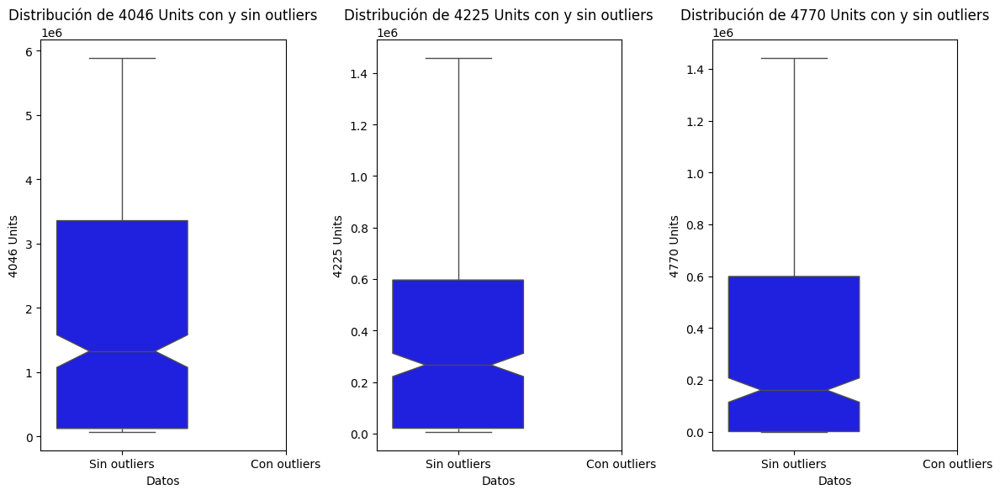

In [34]:
plt.figure(figsize=(12, 6))
for i, column in enumerate(columns_to_analyze):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(data=[non_outliers[column], california_data[column]], 
                palette=["blue", "green"], 
                showfliers=False, 
                notch=True)
    plt.xticks([0, 1], ['Sin outliers', 'Con outliers'])
    plt.title(f"Distribución de {column} con y sin outliers")
    plt.xlabel('Datos')
    plt.ylabel(column)
plt.tight_layout()
plt.show()





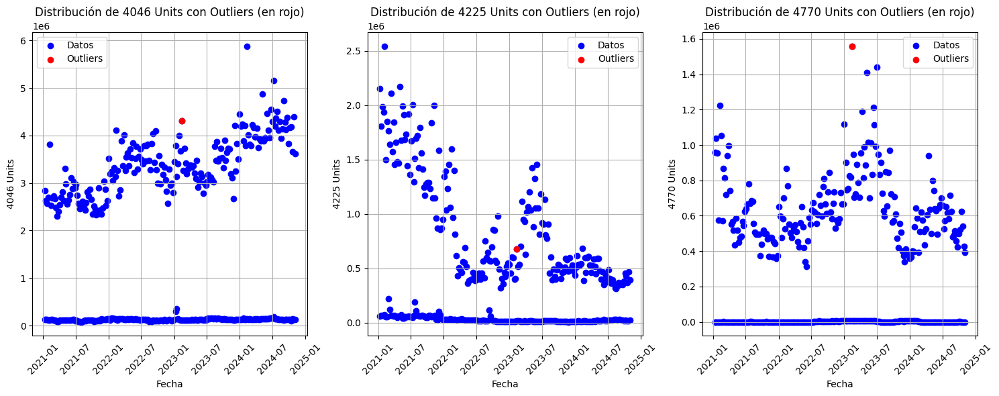

In [35]:
plt.figure(figsize=(15, 6))
for i, column in enumerate(columns_to_analyze):
    plt.subplot(1, 3, i + 1)
    plt.scatter(california_data['Current Year Week Ending'], california_data[column], color='blue', label='Datos')
    plt.scatter(outliers['Current Year Week Ending'], outliers[column], color='red', label='Outliers')
    plt.title(f'Distribución de {column} con Outliers (en rojo)')
    plt.xlabel('Fecha')
    plt.ylabel(column)
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
plt.tight_layout()
plt.show()




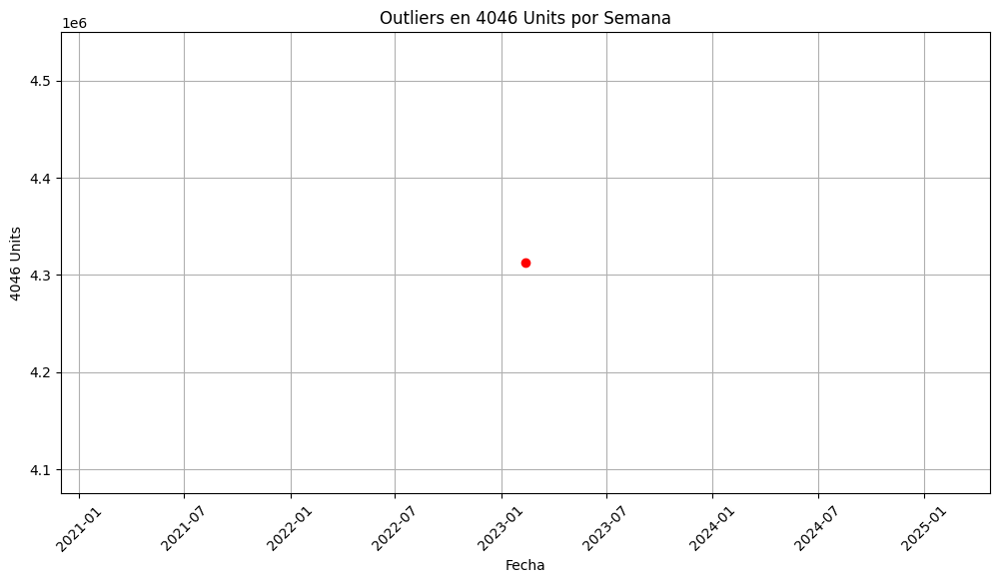

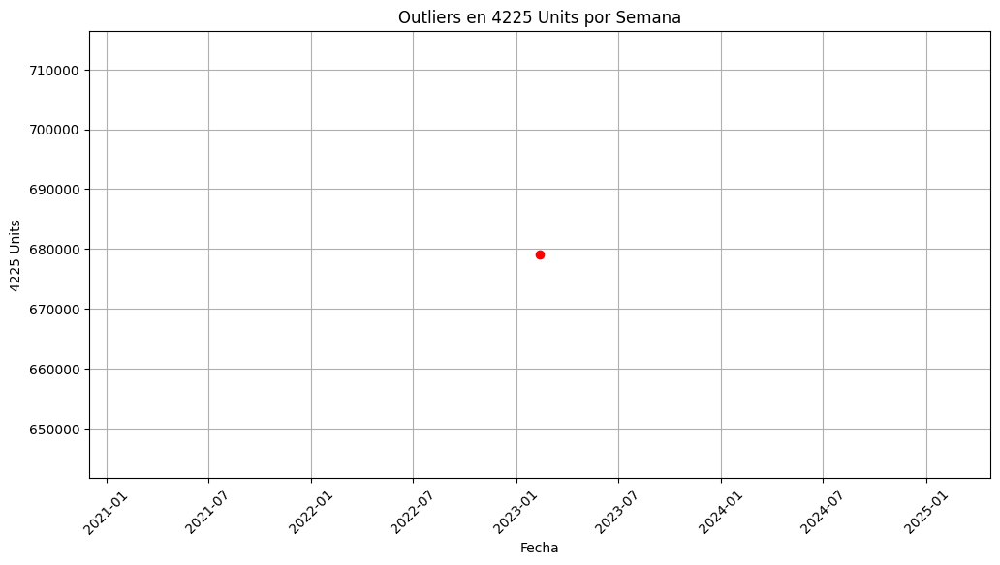

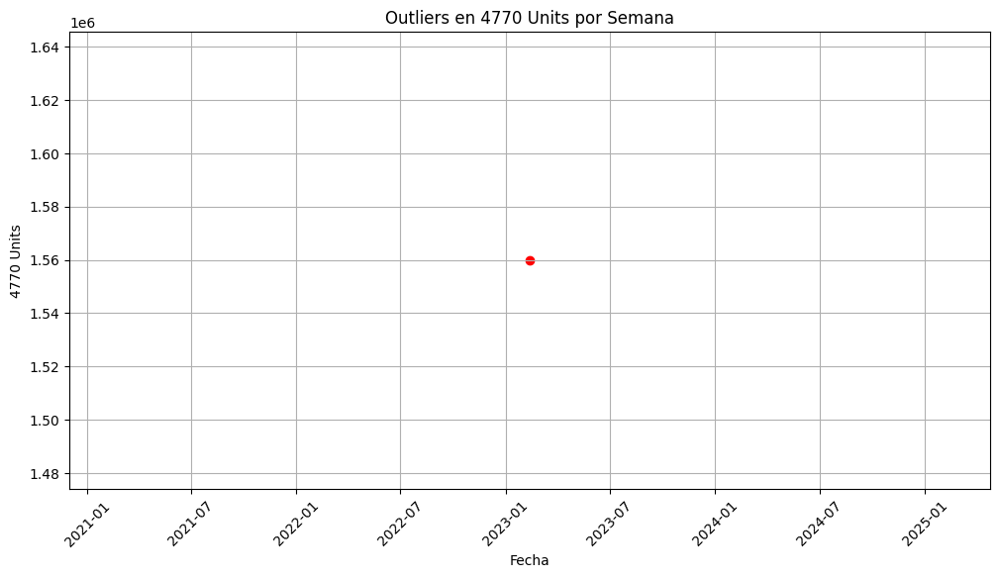

In [36]:
for column in columns_to_analyze:
    plt.figure(figsize=(12, 6))
    plt.scatter(outliers['Current Year Week Ending'], outliers[column], color='red')
    plt.title(f'Outliers en {column} por Semana')
    plt.xlabel('Fecha')
    plt.ylabel(column)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()



Conclusión

Este análisis incluye ahora las tres columnas de interés: '4046 Units', '4225 Units' y '4770 Units'. Hemos realizado:

Cálculo de estadísticas descriptivas para los outliers.
Comparación de los datos no atípicos con los datos completos.
Visualización de distribuciones con y sin outliers.
Evaluación del impacto de los outliers en la media y la desviación estándar.
Visualización temporal de los outliers.
Este enfoque proporciona un análisis profundo de los outliers en estas tres columnas y permite tomar decisiones informadas sobre cómo manejarlos. Si necesitas más detalles o deseas modificar alguna parte del análisis, no dudes en preguntar.

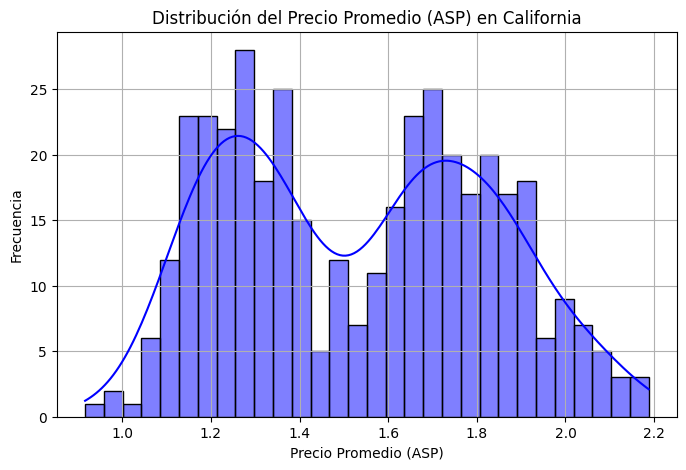

In [37]:
# Histograma de precios promedio
plt.figure(figsize=(8, 5))
sns.histplot(california_data['ASP Current Year'], kde=True, bins=30, color='blue')
plt.title('Distribución del Precio Promedio (ASP) en California')
plt.xlabel('Precio Promedio (ASP)')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


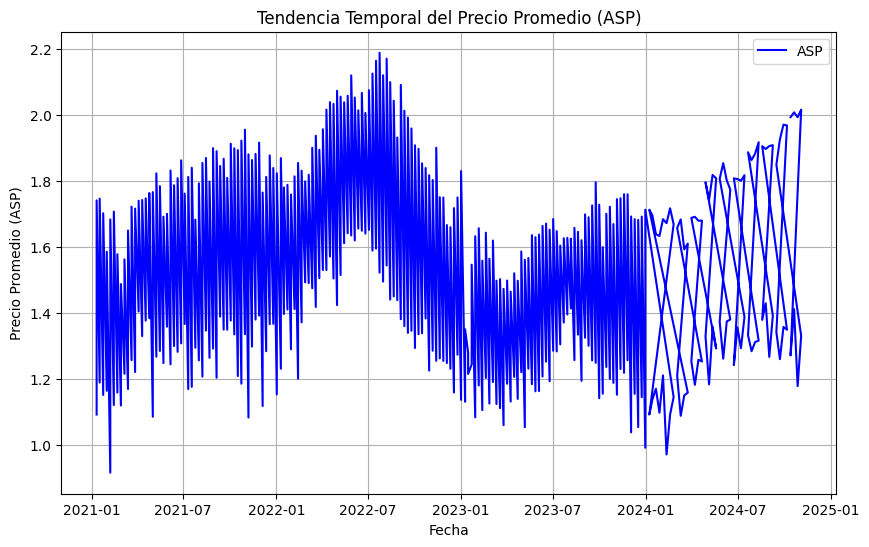

In [38]:
# Convertir la columna de fechas a formato datetime
california_data['Current Year Week Ending'] = pd.to_datetime(california_data['Current Year Week Ending'])

# Visualización de la tendencia temporal
plt.figure(figsize=(10, 6))
plt.plot(california_data['Current Year Week Ending'], california_data['ASP Current Year'], label='ASP', color='blue')
plt.title('Tendencia Temporal del Precio Promedio (ASP)')
plt.xlabel('Fecha')
plt.ylabel('Precio Promedio (ASP)')
plt.legend()
plt.grid(True)
plt.show()


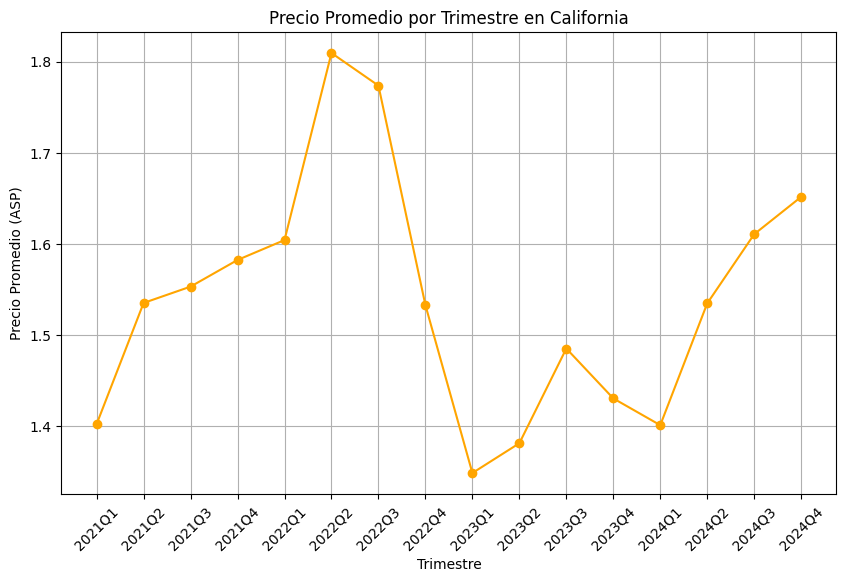

In [39]:
# Agregar una columna para los trimestres
california_data['Quarter'] = california_data['Current Year Week Ending'].dt.to_period('Q')

# Calcular el precio promedio por trimestre
quarterly_prices = california_data.groupby('Quarter')['ASP Current Year'].mean().reset_index()

# Visualización de precios promedio por trimestre
plt.figure(figsize=(10, 6))
plt.plot(quarterly_prices['Quarter'].astype(str), quarterly_prices['ASP Current Year'], marker='o', color='orange')
plt.title('Precio Promedio por Trimestre en California')
plt.xlabel('Trimestre')
plt.ylabel('Precio Promedio (ASP)')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


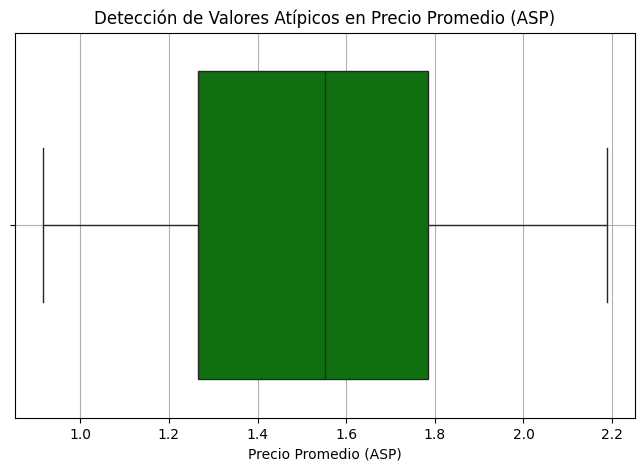

In [40]:
# Boxplot para detectar valores atípicos
plt.figure(figsize=(8, 5))
sns.boxplot(x=california_data['ASP Current Year'], color='green')
plt.title('Detección de Valores Atípicos en Precio Promedio (ASP)')
plt.xlabel('Precio Promedio (ASP)')
plt.grid(True)
plt.show()


In [41]:
# Resumen estadístico por trimestre
quarterly_summary = california_data.groupby('Quarter')['ASP Current Year'].describe()
print("\nEstadísticas descriptivas por trimestre:")
print(quarterly_summary)



Estadísticas descriptivas por trimestre:
         count      mean       std       min       25%       50%       75%  \
Quarter                                                                      
2021Q1    24.0  1.402196  0.272724  0.916127  1.162772  1.372169  1.687614   
2021Q2    26.0  1.535149  0.251051  1.085539  1.301658  1.547757  1.765099   
2021Q3    26.0  1.553075  0.284483  1.169496  1.292719  1.535546  1.832409   
2021Q4    26.0  1.582326  0.311867  1.083105  1.334944  1.578198  1.881044   
2022Q1    26.0  1.604155  0.252307  1.153294  1.410644  1.631761  1.821636   
2022Q2    26.0  1.809390  0.241994  1.423706  1.613231  1.805611  2.037934   
2022Q3    26.0  1.773604  0.319685  1.339556  1.461020  1.791161  2.086243   
2022Q4    26.0  1.532766  0.274557  1.159014  1.265094  1.521285  1.789357   
2023Q1    26.0  1.348546  0.230248  1.059969  1.132496  1.261741  1.555153   
2023Q2    26.0  1.381232  0.214569  1.053989  1.187425  1.358580  1.580985   
2023Q3    26.0  1.4851

In [45]:
# Calcular cuartiles
Q1 = california_data['ASP Current Year'].quantile(0.25)
Q3 = california_data['ASP Current Year'].quantile(0.75)
IQR = Q3 - Q1

# Calcular los límites de los outliers
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Identificar valores fuera de los límites
outliers = california_data[(california_data['ASP Current Year'] < lower_limit) |
                            (california_data['ASP Current Year'] > upper_limit)]

# Mostrar resultados
print("Límite inferior:", lower_limit)
print("Límite superior:", upper_limit)
print("Número de outliers:", len(outliers))
print(outliers)

Límite inferior: 0.4885785173749997
Límite superior: 2.5619282283750002
Número de outliers: 0
Empty DataFrame
Columns: [Geography, Timeframe, Current Year Week Ending, Type, ASP Current Year, Total Bulk and Bags Units, 4046 Units, 4225 Units, 4770 Units, TotalBagged Units, SmlBagged Units, LrgBagged Units, X-LrgBagged Units, Quarter]
Index: []


In [46]:
#Bivariado

#Trimestre vs Total Volumne (venta)
#Regiones vs Total volumen (venta)
#Trimestre vs AVG precio

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

avocado_df = pd.read_csv('dataset/avocado_df.csv')

cities = ['Albany', 'Atlanta', 'Boise', 'Boston', 'Charlotte', 'Chicago', 'Columbus', 
          'Denver', 'Detroit', 'Grand Rapids', 'Houston', 'Indianapolis', 'Jacksonville', 
          'Las Vegas', 'Los Angeles', 'Louisville', 'Nashville', 'New York', 'Orlando', 
          'Philadelphia', 'Pittsburgh', 'Providence', 'Portland', 'Roanoke', 'Sacramento', 
          'San Diego', 'San Francisco', 'Seattle', 'Spokane', 'St. Louis', 'Syracuse', 
          'Tampa', 'Toledo', 'Wichita']

regions = ['Baltimore/Washington', 'Birmingham/Montgomery', 'Buffalo/Rochester', 
           'Cincinnati/Dayton', 'Dallas/Ft. Worth', 'Harrisburg/Scranton', 
           'Hartford/Springfield', 'Miami/Ft. Lauderdale', 'New Orleans/Mobile', 
           'Northern New England', 'Peoria/Springfield', 'Phoenix/Tucson', 
           'Raleigh/Greensboro', 'Richmond/Norfolk', 'South Carolina', 'West Tex/New Mexico']

greaterregions = ['California', 'Great Lakes', 'Midsouth', 'Northeast', 'Plains', 
                  'South Central', 'Southeast', 'West']

filtered_df_greaterregions = avocado_df[avocado_df['Geography'].isin(greaterregions)]

In [48]:
filtered_df_greaterregions.head()

,Geography,Timeframe,Current Year Week Ending,Type,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,SmlBagged Units,LrgBagged Units,X-LrgBagged Units
50,California,Weekly,2021-01-11,Conventional,1.092303,7305333.58,2845001.28,2152753.34,959794.53,1347784.44,NaN,NaN,NaN
51,Great Lakes,Weekly,2021-01-11,Conventional,0.909006,5245629.02,2154802.80,1508395.12,372998.01,1209433.08,NaN,NaN,NaN
52,Midsouth,Weekly,2021-01-11,Conventional,0.904031,4935644.59,2239861.89,1133848.51,13977.19,1547957.00,NaN,NaN,NaN
53,Northeast,Weekly,2021-01-11,Conventional,1.074509,6586438.02,1046371.60,3486564.63,7295.55,2046206.24,NaN,NaN,NaN
54,Plains,Weekly,2021-01-11,Conventional,0.853520,2605939.78,1279482.18,560207.22,3575.90,762674.48,NaN,NaN,NaN


C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\93527901.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\93527901.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



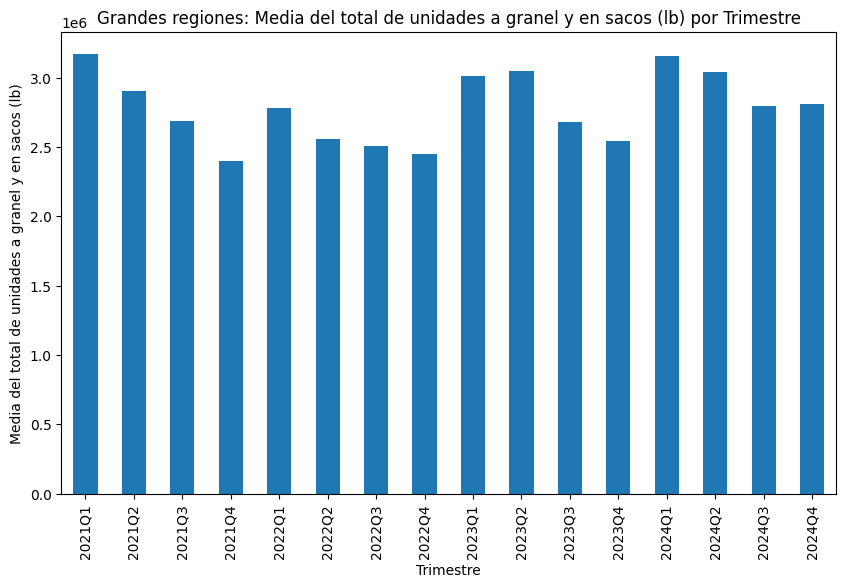

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

filtered_df_greaterregions['Current Year Week Ending'] = pd.to_datetime(filtered_df_greaterregions['Current Year Week Ending'])

filtered_df_greaterregions['Quarter'] = filtered_df_greaterregions['Current Year Week Ending'].dt.to_period('Q')
quarterly_mean = filtered_df_greaterregions.groupby('Quarter')['Total Bulk and Bags Units'].mean()

plt.figure(figsize=(10, 6))
quarterly_mean.plot(kind='bar')
plt.xlabel('Trimestre')
plt.ylabel('Media del total de unidades a granel y en sacos (lb)')
plt.title('Grandes regiones: Media del total de unidades a granel y en sacos (lb) por Trimestre')
plt.show()

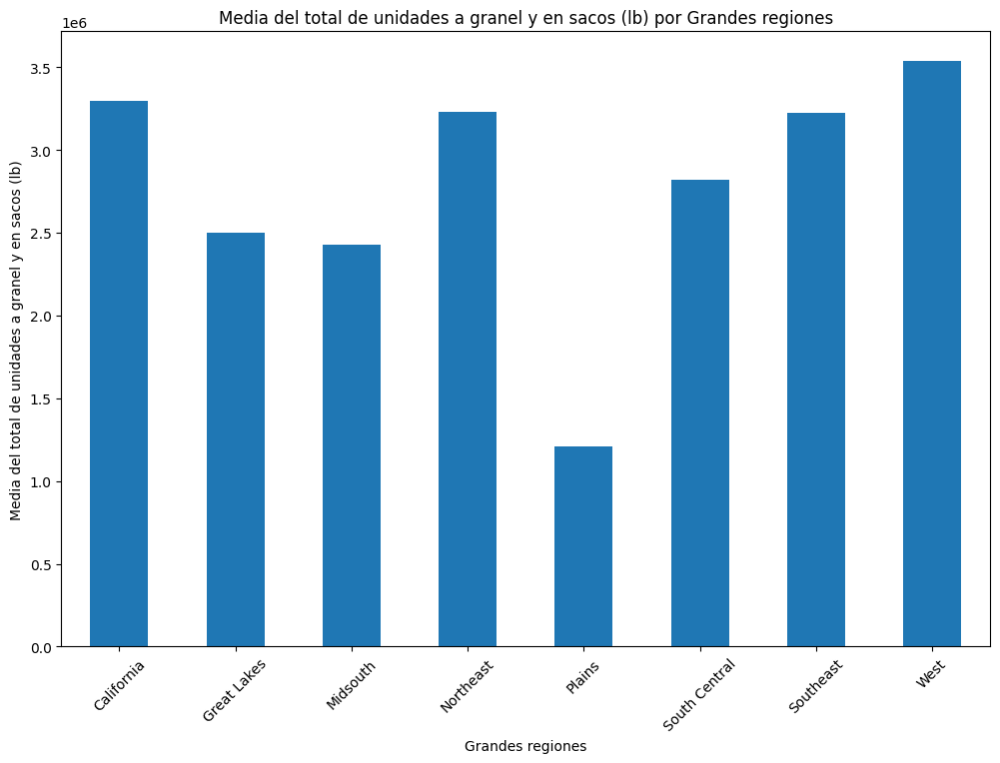

In [50]:
# Group by "Geography" and calculate the mean of "Total Bulk and Bags Units"
geography_mean = filtered_df_greaterregions.groupby('Geography')['Total Bulk and Bags Units'].mean()

# Plot the data
plt.figure(figsize=(12, 8))
geography_mean.plot(kind='bar')
plt.xlabel('Grandes regiones')
plt.ylabel('Media del total de unidades a granel y en sacos (lb)')
plt.title('Media del total de unidades a granel y en sacos (lb) por Grandes regiones')
plt.xticks(rotation=45)
plt.show()

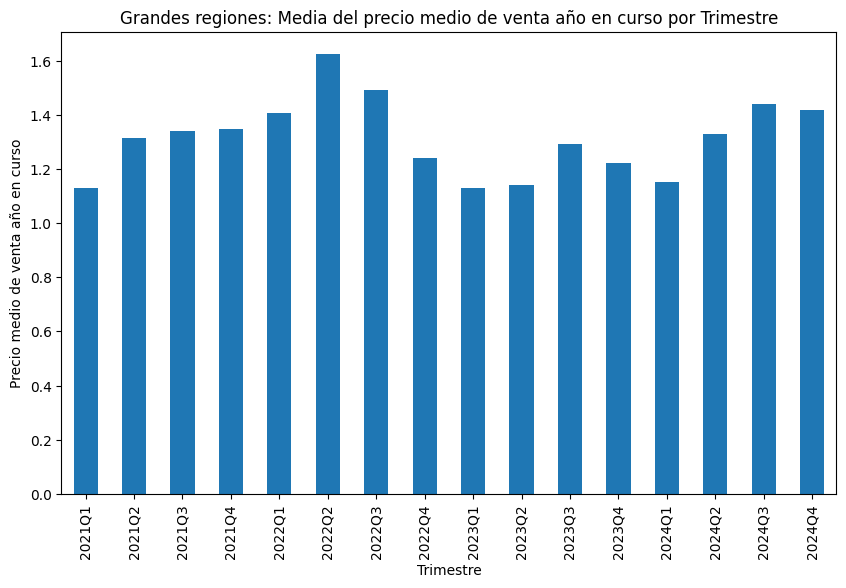

In [51]:
quarterly_mean = filtered_df_greaterregions.groupby('Quarter')['ASP Current Year'].mean()

plt.figure(figsize=(10, 6))
quarterly_mean.plot(kind='bar')
plt.xlabel('Trimestre')
plt.ylabel('Precio medio de venta año en curso')
plt.title('Grandes regiones: Media del precio medio de venta año en curso por Trimestre')
plt.show()

In [52]:
#tbd
#Elasticidad Total Bulk and Bags Units - ASP Current Year per quater

#Elasticidad Total Bulk and Bags Units - ASP Current Year per region

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\1174797314.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\1174797314.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\1174797314.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

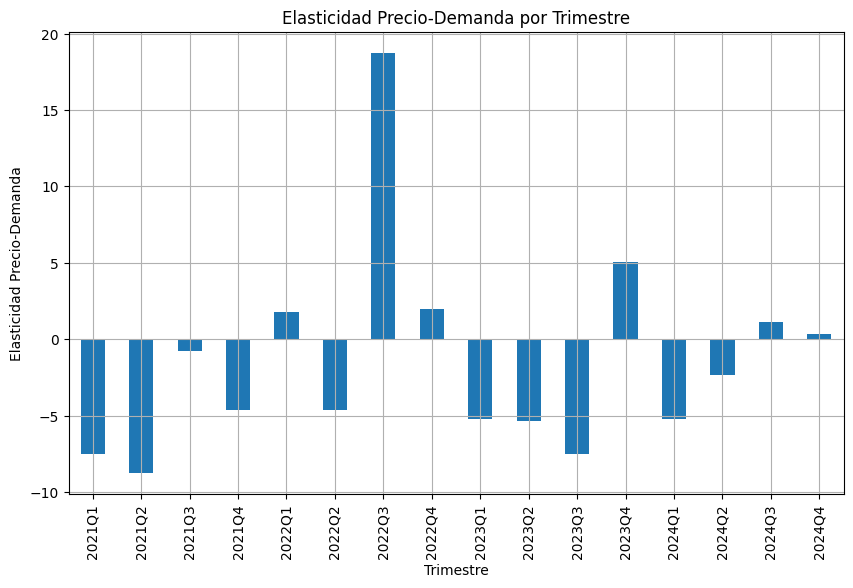

In [53]:
# Calculate the percentage change for Total Bulk and Bags Units and ASP Current Year
filtered_df_greaterregions['Pct_Change_Units'] = filtered_df_greaterregions['Total Bulk and Bags Units'].pct_change()
filtered_df_greaterregions['Pct_Change_Price'] = filtered_df_greaterregions['ASP Current Year'].pct_change()

# Calculate the price elasticity of demand
filtered_df_greaterregions['Elasticity'] = filtered_df_greaterregions['Pct_Change_Units'] / filtered_df_greaterregions['Pct_Change_Price']

# Group by Quarter and calculate the mean elasticity
quarterly_elasticity = filtered_df_greaterregions.groupby('Quarter')['Elasticity'].mean()

# Plot the elasticity by quarter
plt.figure(figsize=(10, 6))
quarterly_elasticity.plot(kind='bar')
plt.xlabel('Trimestre')
plt.ylabel('Elasticidad Precio-Demanda')
plt.title('Elasticidad Precio-Demanda por Trimestre')
plt.grid(True)
plt.show()

In [54]:
filtered_df_greaterregions.head()

,Geography,Timeframe,Current Year Week Ending,Type,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,SmlBagged Units,LrgBagged Units,X-LrgBagged Units,Quarter,Pct_Change_Units,Pct_Change_Price,Elasticity
50,California,Weekly,2021-01-11,Conventional,1.092303,7305333.58,2845001.28,2152753.34,959794.53,1347784.44,NaN,NaN,NaN,2021Q1,NaN,NaN,NaN
51,Great Lakes,Weekly,2021-01-11,Conventional,0.909006,5245629.02,2154802.80,1508395.12,372998.01,1209433.08,NaN,NaN,NaN,2021Q1,-0.281945,-0.167808,1.680168
52,Midsouth,Weekly,2021-01-11,Conventional,0.904031,4935644.59,2239861.89,1133848.51,13977.19,1547957.00,NaN,NaN,NaN,2021Q1,-0.059094,-0.005473,10.797580
53,Northeast,Weekly,2021-01-11,Conventional,1.074509,6586438.02,1046371.60,3486564.63,7295.55,2046206.24,NaN,NaN,NaN,2021Q1,0.334464,0.188576,1.773626
54,Plains,Weekly,2021-01-11,Conventional,0.853520,2605939.78,1279482.18,560207.22,3575.90,762674.48,NaN,NaN,NaN,2021Q1,-0.604348,-0.205666,2.938497


In [55]:
# Sort the DataFrame by "Current Year Week Ending", "Geography", and "Type"
filtered_df_greaterregions = filtered_df_greaterregions.sort_values(by=['Current Year Week Ending', 'Geography', 'Type'])

filtered_df_greaterregions.head()

,Geography,Timeframe,Current Year Week Ending,Type,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,SmlBagged Units,LrgBagged Units,X-LrgBagged Units,Quarter,Pct_Change_Units,Pct_Change_Price,Elasticity
50,California,Weekly,2021-01-11,Conventional,1.092303,7305333.58,2845001.28,2152753.34,959794.53,1347784.44,NaN,NaN,NaN,2021Q1,NaN,NaN,NaN
109,California,Weekly,2021-01-11,Organic,1.740612,376178.67,123236.27,57994.25,34.38,194913.77,NaN,NaN,NaN,2021Q1,-0.953133,0.946865,-1.006620
51,Great Lakes,Weekly,2021-01-11,Conventional,0.909006,5245629.02,2154802.80,1508395.12,372998.01,1209433.08,NaN,NaN,NaN,2021Q1,-0.281945,-0.167808,1.680168
110,Great Lakes,Weekly,2021-01-11,Organic,1.259101,296746.01,25803.58,59181.52,0.00,211760.92,NaN,NaN,NaN,2021Q1,-0.211157,-0.276633,0.763310
52,Midsouth,Weekly,2021-01-11,Conventional,0.904031,4935644.59,2239861.89,1133848.51,13977.19,1547957.00,NaN,NaN,NaN,2021Q1,-0.059094,-0.005473,10.797580


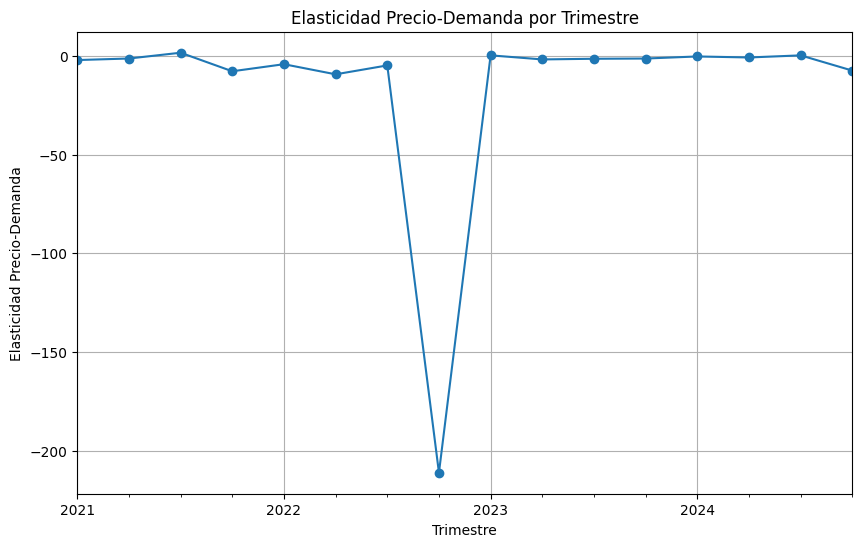

In [56]:
# Group by "Current Year Week Ending" and calculate the mean of "Total Bulk and Bags Units" and "ASP Current Year"
weekly_mean = filtered_df_greaterregions.groupby('Current Year Week Ending')[['Total Bulk and Bags Units', 'ASP Current Year']].mean()

# Calculate the percentage change for Total Bulk and Bags Units and ASP Current Year
weekly_mean['Pct_Change_Units'] = weekly_mean['Total Bulk and Bags Units'].pct_change()
weekly_mean['Pct_Change_Price'] = weekly_mean['ASP Current Year'].pct_change()

# Calculate the price elasticity of demand
weekly_mean['Elasticity'] = weekly_mean['Pct_Change_Units'] / weekly_mean['Pct_Change_Price']

# Add a Quarter column
weekly_mean['Quarter'] = weekly_mean.index.to_period('Q')

# Group by Quarter and calculate the mean elasticity
quarterly_elasticity = weekly_mean.groupby('Quarter')['Elasticity'].mean()

# Plot the elasticity by quarter
plt.figure(figsize=(10, 6))
quarterly_elasticity.plot(kind='line', marker='o')
plt.xlabel('Trimestre')
plt.ylabel('Elasticidad Precio-Demanda')
plt.title('Elasticidad Precio-Demanda por Trimestre')
plt.grid(True)
plt.show()

**Analisis de Cohortes Avanzados**

In [73]:
# Mostrar las columnas del dataframe para revisar las variables
print(filtered_df_greaterregions.columns)


Index(['Geography', 'Timeframe', 'Current Year Week Ending', 'Type',
       'ASP Current Year', 'Total Bulk and Bags Units', '4046 Units',
       '4225 Units', '4770 Units', 'TotalBagged Units', 'SmlBagged Units',
       'LrgBagged Units', 'X-LrgBagged Units', 'Quarter', 'Pct_Change_Units',
       'Pct_Change_Price', 'Elasticity'],
      dtype='object')


In [74]:
# Mostrar las primeras filas del dataframe filtrado para California
print(filtered_df_greaterregions.head())


       Geography Timeframe Current Year Week Ending          Type  \
50    California    Weekly               2021-01-11  Conventional   
109   California    Weekly               2021-01-11       Organic   
51   Great Lakes    Weekly               2021-01-11  Conventional   
110  Great Lakes    Weekly               2021-01-11       Organic   
52      Midsouth    Weekly               2021-01-11  Conventional   

     ASP Current Year  Total Bulk and Bags Units  4046 Units  4225 Units  \
50           1.092303                 7305333.58  2845001.28  2152753.34   
109          1.740612                  376178.67   123236.27    57994.25   
51           0.909006                 5245629.02  2154802.80  1508395.12   
110          1.259101                  296746.01    25803.58    59181.52   
52           0.904031                 4935644.59  2239861.89  1133848.51   

     4770 Units  TotalBagged Units  SmlBagged Units  LrgBagged Units  \
50    959794.53         1347784.44              NaN     

In [119]:
copy_greaterregions = filtered_df_greaterregions.copy()

In [120]:
print(type(copy_greaterregions))

<class 'pandas.core.frame.DataFrame'>


In [121]:
# Verifica si se cargaron los datos correctamente
print(copy_greaterregions.head())
print(copy_greaterregions.dtypes)

# 1. Limpieza inicial de datos
# Convertir fechas a datetime
copy_greaterregions['Current Year Week Ending'] = pd.to_datetime(
    copy_greaterregions['Current Year Week Ending'], 
    errors='coerce'
)

# Eliminar filas con ASP o Total Bulk and Bags Units nulos
data_cleaned = copy_greaterregions.dropna(subset=['ASP Current Year', 'Total Bulk and Bags Units'])

# Verifica si la limpieza fue exitosa
print(data_cleaned.head())


       Geography Timeframe Current Year Week Ending          Type  \
50    California    Weekly               2021-01-11  Conventional   
109   California    Weekly               2021-01-11       Organic   
51   Great Lakes    Weekly               2021-01-11  Conventional   
110  Great Lakes    Weekly               2021-01-11       Organic   
52      Midsouth    Weekly               2021-01-11  Conventional   

     ASP Current Year  Total Bulk and Bags Units  4046 Units  4225 Units  \
50           1.092303                 7305333.58  2845001.28  2152753.34   
109          1.740612                  376178.67   123236.27    57994.25   
51           0.909006                 5245629.02  2154802.80  1508395.12   
110          1.259101                  296746.01    25803.58    59181.52   
52           0.904031                 4935644.59  2239861.89  1133848.51   

     4770 Units  TotalBagged Units  SmlBagged Units  LrgBagged Units  \
50    959794.53         1347784.44              NaN     

In [122]:
# 1. Limpieza inicial de datos
# Convertir fechas a datetime
copy_greaterregions['Current Year Week Ending'] = pd.to_datetime(copy_greaterregions['Current Year Week Ending'], errors='coerce')

# Eliminar filas con ASP o Total Bulk and Bags Units nulos
data_cleaned = copy_greaterregions.dropna(subset=['ASP Current Year', 'Total Bulk and Bags Units'])

In [123]:
# 2. Clasificación por cohortes de precio (Low, Medium, High)
def price_cohort(asp):
    if asp <= 1.0:
        return 'Low Price'
    elif asp <= 1.5:
        return 'Medium Price'
    else:
        return 'High Price'

data_cleaned['Price Cohort'] = data_cleaned['ASP Current Year'].apply(price_cohort)

# Calcular ventas totales por cohorte y fecha
data_cleaned['Total Sales'] = data_cleaned['Total Bulk and Bags Units']
cohort_sales = data_cleaned.groupby(['Price Cohort', 'Current Year Week Ending']).agg(
    total_sales=('Total Sales', 'sum'),
    asp=('ASP Current Year', 'mean')
).reset_index()

In [124]:
# 3. Detección de valores atípicos usando estadísticas descriptivas
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Detectar valores atípicos en ventas totales y ASP
outliers_sales, lb_sales, ub_sales = detect_outliers(cohort_sales, 'total_sales')
outliers_asp, lb_asp, ub_asp = detect_outliers(data_cleaned, 'ASP Current Year')

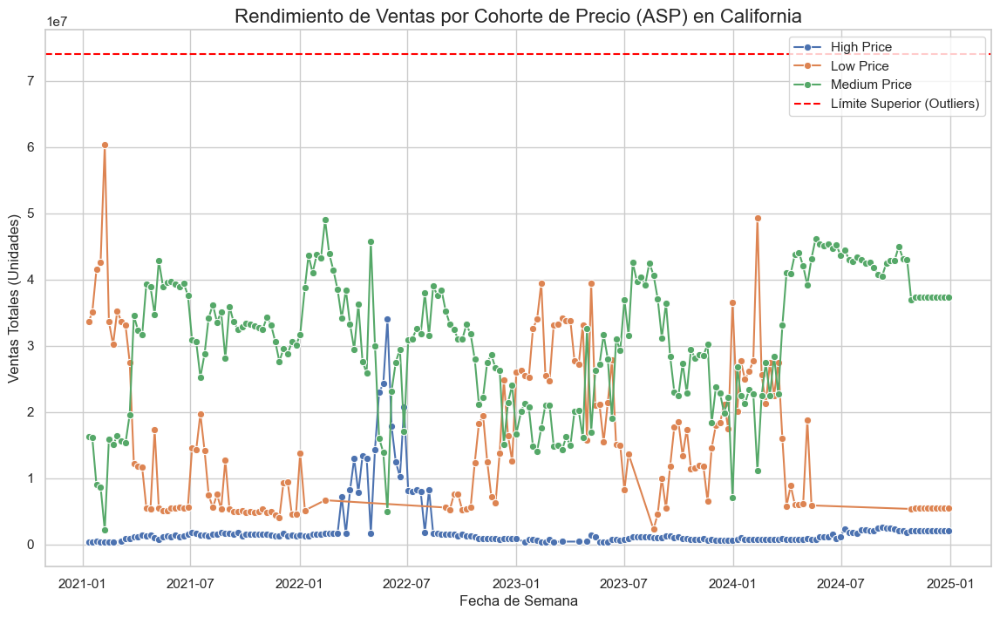

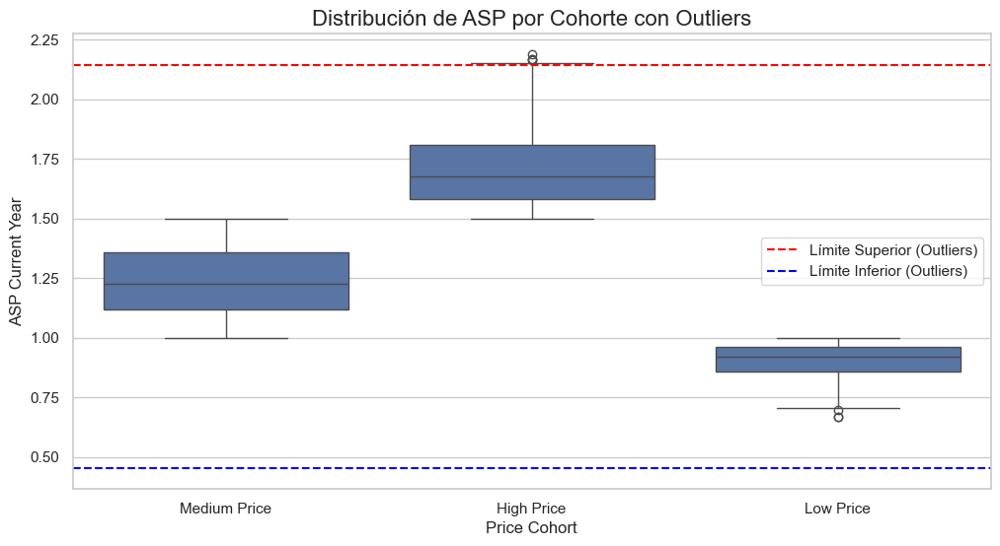

In [125]:
# 4. Visualización de resultados

# Ventas Totales por Cohorte
plt.figure(figsize=(14, 8))
sns.lineplot(data=cohort_sales, x='Current Year Week Ending', y='total_sales', hue='Price Cohort', marker='o')
plt.title('Rendimiento de Ventas por Cohorte de Precio (ASP) en California', fontsize=16)
plt.xlabel('Fecha de Semana', fontsize=12)
plt.ylabel('Ventas Totales (Unidades)', fontsize=12)
plt.axhline(y=ub_sales, color='red', linestyle='--', label='Límite Superior (Outliers)')
plt.legend()
plt.grid(True)
plt.show()

# Distribución de ASP con valores atípicos
plt.figure(figsize=(12, 6))
sns.boxplot(data=data_cleaned, x='Price Cohort', y='ASP Current Year')
plt.title('Distribución de ASP por Cohorte con Outliers', fontsize=16)
plt.axhline(y=ub_asp, color='red', linestyle='--', label='Límite Superior (Outliers)')
plt.axhline(y=lb_asp, color='blue', linestyle='--', label='Límite Inferior (Outliers)')
plt.legend()
plt.show()

In [126]:
# 5. Mostrar resultados de valores atípicos
print("Valores Atípicos en Ventas Totales:")
print(outliers_sales)
print("\nValores Atípicos en ASP Current Year:")
print(outliers_asp)

Valores Atípicos en Ventas Totales:
Empty DataFrame
Columns: [Price Cohort, Current Year Week Ending, total_sales, asp]
Index: []

Valores Atípicos en ASP Current Year:
        Geography Timeframe Current Year Week Ending     Type  \
8612         West    Weekly               2022-05-29  Organic   
9431   California    Weekly               2022-07-17  Organic   
9549   California    Weekly               2022-07-24  Organic   
9785   California    Weekly               2022-08-07  Organic   
22653        West    Weekly               2024-09-01  Organic   
22652        West    Weekly               2024-09-08  Organic   

       ASP Current Year  Total Bulk and Bags Units  4046 Units  4225 Units  \
8612           2.169707                  349236.23    74323.68   113433.33   
9431           2.163440                  328049.44   120674.50    19235.44   
9549           2.187760                  325218.45   125092.39    19908.40   
9785           2.169688                  316083.78   121215.45 

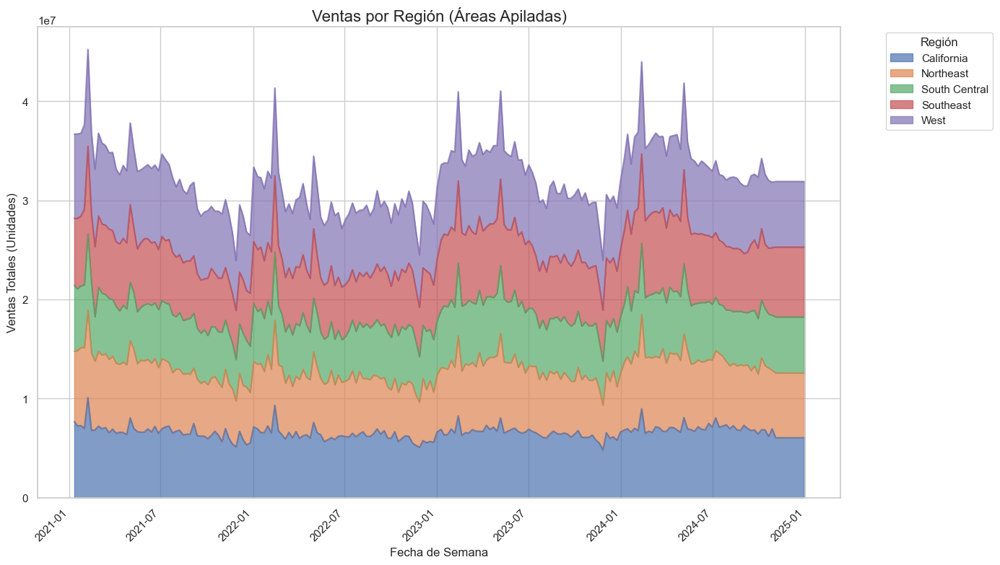

In [128]:
# Pivotar el DataFrame para obtener las regiones como columnas
region_sales_pivot = top_5_region_sales.pivot_table(
    values='total_sales', 
    index='Current Year Week Ending', 
    columns='Geography', 
    aggfunc='sum'
)

# Visualizar el gráfico de áreas apiladas
region_sales_pivot.plot(kind='area', stacked=True, figsize=(14, 8), alpha=0.7)

# Personalizar el gráfico
plt.title('Ventas por Región (Áreas Apiladas)', fontsize=16)
plt.xlabel('Fecha de Semana', fontsize=12)
plt.ylabel('Ventas Totales (Unidades)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Región', loc='upper left', bbox_to_anchor=(1.05, 1))

# Mostrar el gráfico
plt.tight_layout()
plt.show()


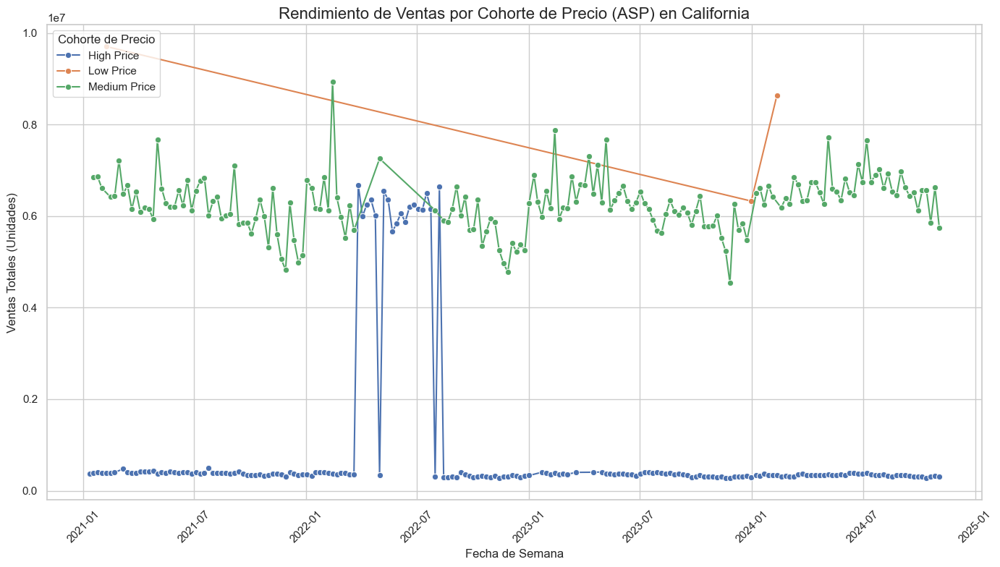

In [129]:
# Asegurarnos de que 'Current Year Week Ending' esté en formato de fecha
california_data['Current Year Week Ending'] = pd.to_datetime(california_data['Current Year Week Ending'], errors='coerce')

# Crear una nueva columna 'Price Cohort' para clasificar los productos según su ASP
def price_cohort(asp):
    if asp <= 1.0:
        return 'Low Price'
    elif asp <= 1.5:
        return 'Medium Price'
    else:
        return 'High Price'

california_data['Price Cohort'] = california_data['ASP Current Year'].apply(price_cohort)

# Calcular las ventas totales por cohorte y semana
california_data['Total Sales'] = california_data['Total Bulk and Bags Units']

# Agrupar por cohorte de precio y semana
cohort_sales = california_data.groupby(['Price Cohort', 'Current Year Week Ending']).agg(
    total_sales=('Total Sales', 'sum')
).reset_index()

# Visualizar el rendimiento de las cohortes a lo largo del tiempo
plt.figure(figsize=(14, 8))
sns.lineplot(data=cohort_sales, x='Current Year Week Ending', y='total_sales', hue='Price Cohort', marker='o')

# Personalizar el gráfico
plt.title('Rendimiento de Ventas por Cohorte de Precio (ASP) en California', fontsize=16)
plt.xlabel('Fecha de Semana', fontsize=12)
plt.ylabel('Ventas Totales (Unidades)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Cohorte de Precio', loc='upper left')

# Mostrar el gráfico
plt.tight_layout()
plt.show()



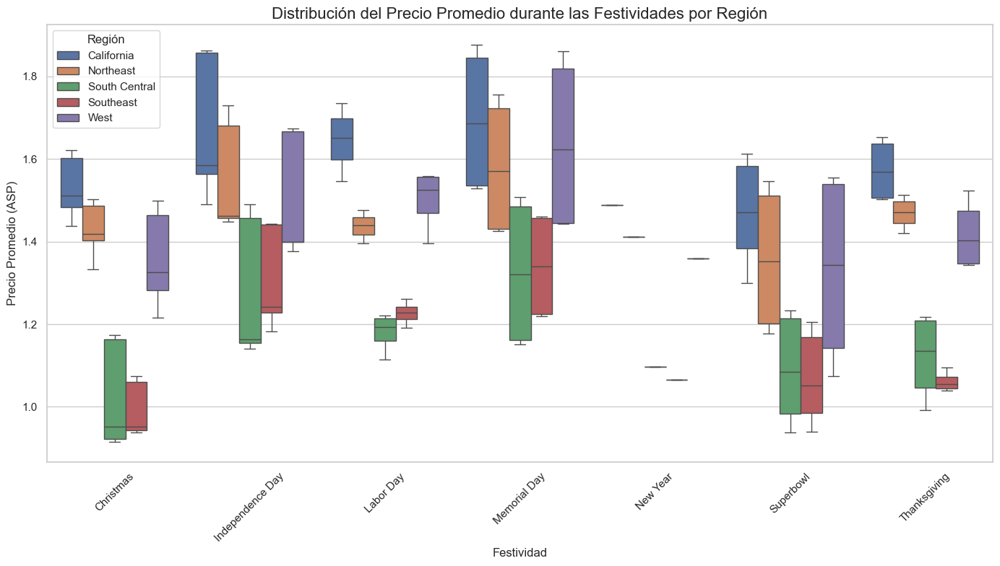

In [109]:
# Visualizar el gráfico de caja
plt.figure(figsize=(14, 8))
sns.boxplot(data=precio_promedio_festividades, x='Festividad', y='ASP Current Year', hue='Geography')

# Personalizar el gráfico
plt.title('Distribución del Precio Promedio durante las Festividades por Región', fontsize=16)
plt.xlabel('Festividad', fontsize=12)
plt.ylabel('Precio Promedio (ASP)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Región', loc='upper left')

# Mostrar el gráfico
plt.tight_layout()
plt.show()


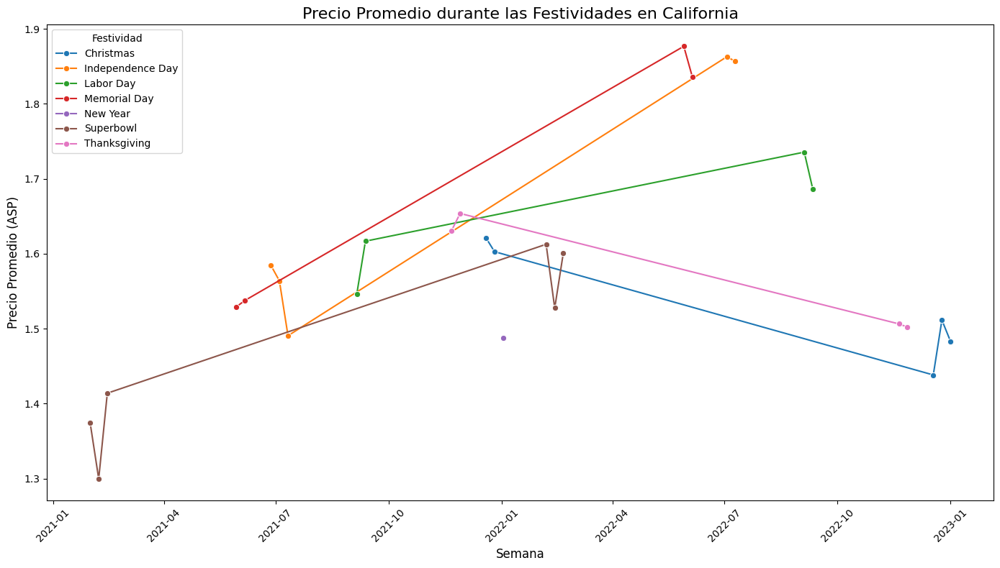

In [79]:
# Asegurarnos de que las fechas estén en formato de fecha
california_data['Current Year Week Ending'] = pd.to_datetime(california_data['Current Year Week Ending'], errors='coerce')

# Crear una lista de las fechas de las festividades clave
festividades = {
    'Thanksgiving': ['2021-11-25', '2022-11-24'],  # Día de Acción de Gracias (último jueves de noviembre)
    'Superbowl': ['2021-02-07', '2022-02-13'],  # Super Bowl (primer domingo de febrero)
    'Independence Day': ['2021-07-04', '2022-07-04'],  # Día de la Independencia (4 de julio)
    'Christmas': ['2021-12-25', '2022-12-25'],  # Navidad (25 de diciembre)
    'New Year': ['2022-01-01'],  # Año Nuevo (1 de enero)
    'Memorial Day': ['2021-05-31', '2022-05-30'],  # Memorial Day (último lunes de mayo)
    'Labor Day': ['2021-09-06', '2022-09-05'],  # Labor Day (primer lunes de septiembre)
    'Black Friday': ['2021-11-26', '2022-11-25']  # Black Friday (viernes después de Acción de Gracias)
}

# Convertir las fechas de las festividades a datetime
for key in festividades:
    festividades[key] = pd.to_datetime(festividades[key])

# Filtrar los datos para la región de California
california_data = california_data[california_data['Geography'] == 'California']

# Crear una columna que indique si la fecha está cerca de alguna festividad
def es_festividad(fecha):
    for festividad, fechas in festividades.items():
        for f in fechas:
            # Verificar si la fecha está dentro de +/- 7 días de la festividad
            if abs((fecha - f).days) <= 7:
                return festividad
    return None

# Aplicar la función para crear una nueva columna de festividades
california_data['Festividad'] = california_data['Current Year Week Ending'].apply(es_festividad)

# Filtrar los datos para aquellas filas que corresponden a una festividad
festividades_data = california_data.dropna(subset=['Festividad'])

# Calcular el precio promedio por semana y por festividad
precio_promedio_festividades = festividades_data.groupby(['Festividad', 'Current Year Week Ending'])['ASP Current Year'].mean().reset_index()

# Visualizar los resultados
plt.figure(figsize=(14, 8))
sns.lineplot(data=precio_promedio_festividades, x='Current Year Week Ending', y='ASP Current Year', hue='Festividad', marker='o')

# Personalizar el gráfico
plt.title('Precio Promedio durante las Festividades en California', fontsize=16)
plt.xlabel('Semana', fontsize=12)
plt.ylabel('Precio Promedio (ASP)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Festividad', loc='upper left')

# Mostrar el gráfico
plt.tight_layout()
plt.show()


In [81]:
# Crear una lista de las fechas de las festividades clave y su mes
festividades = {
    'Thanksgiving': ['2021-11-25', '2022-11-24'],  # Día de Acción de Gracias (último jueves de noviembre)
    'Superbowl': ['2021-02-07', '2022-02-13'],  # Super Bowl (primer domingo de febrero)
    'Independence Day': ['2021-07-04', '2022-07-04'],  # Día de la Independencia (4 de julio)
    'Christmas': ['2021-12-25', '2022-12-25'],  # Navidad (25 de diciembre)
    'New Year': ['2022-01-01'],  # Año Nuevo (1 de enero)
    'Memorial Day': ['2021-05-31', '2022-05-30'],  # Memorial Day (último lunes de mayo)
    'Labor Day': ['2021-09-06', '2022-09-05'],  # Labor Day (primer lunes de septiembre)
    'Black Friday': ['2021-11-26', '2022-11-25']  # Black Friday (viernes después de Acción de Gracias)
}

# Convertir las fechas de las festividades a datetime
for key in festividades:
    festividades[key] = pd.to_datetime(festividades[key])

# Función para determinar si el mes contiene alguna festividad
def contiene_festividad(fecha):
    mes = fecha.month  # Obtener el mes de la fecha
    for festividad, fechas in festividades.items():
        for f in fechas:
            # Si la festividad ocurre en el mismo mes que la fecha
            if f.month == mes:
                return 'Sí'
    return 'No'

# Filtrar los datos para la región de California
california_data = california_data[california_data['Geography'] == 'California']

# Convertir la columna de fecha a datetime si aún no está
california_data['Current Year Week Ending'] = pd.to_datetime(california_data['Current Year Week Ending'], errors='coerce')

# Aplicar la función para crear una nueva columna de "Mes Contiene Festividad"
california_data['Mes Contiene Festividad'] = california_data['Current Year Week Ending'].apply(contiene_festividad)

# Mostrar los primeros datos para ver cómo quedó
print(california_data[['Current Year Week Ending', 'Mes Contiene Festividad']].head())

        


    Current Year Week Ending Mes Contiene Festividad
109               2021-01-11                      Sí
168               2021-01-17                      Sí
227               2021-01-17                      Sí
286               2021-01-24                      Sí
345               2021-01-24                      Sí


In [82]:
# Asegurarse de que la columna de precios esté disponible
# Calcular el precio promedio por cohorte (Mes con festividad vs. Mes sin festividad)
cohorte_precio = california_data.groupby('Mes Contiene Festividad')['ASP Current Year'].mean().reset_index()

# Mostrar el precio promedio por cohorte
print(cohorte_precio)


  Mes Contiene Festividad  ASP Current Year
0                      No          1.550024
1                      Sí          1.526083


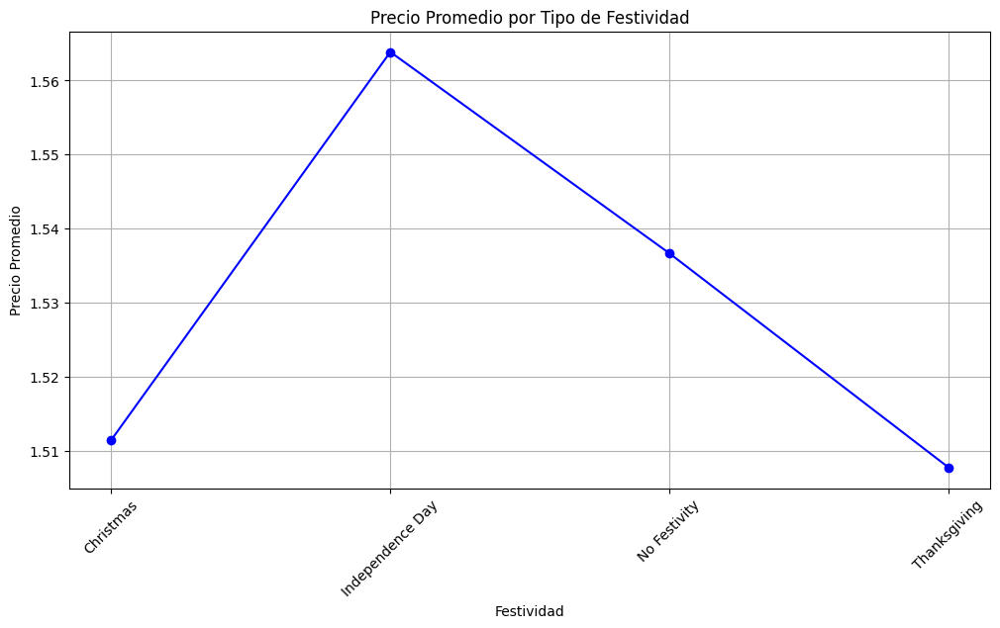

In [85]:
# Gráfico de líneas para visualizar el precio promedio por festividad
plt.figure(figsize=(12, 6))
plt.plot(cohorte_precio_festividad['Festividad'], cohorte_precio_festividad['ASP Current Year'], marker='o', linestyle='-', color='blue')
plt.xlabel('Festividad')
plt.ylabel('Precio Promedio')
plt.title('Precio Promedio por Tipo de Festividad')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()




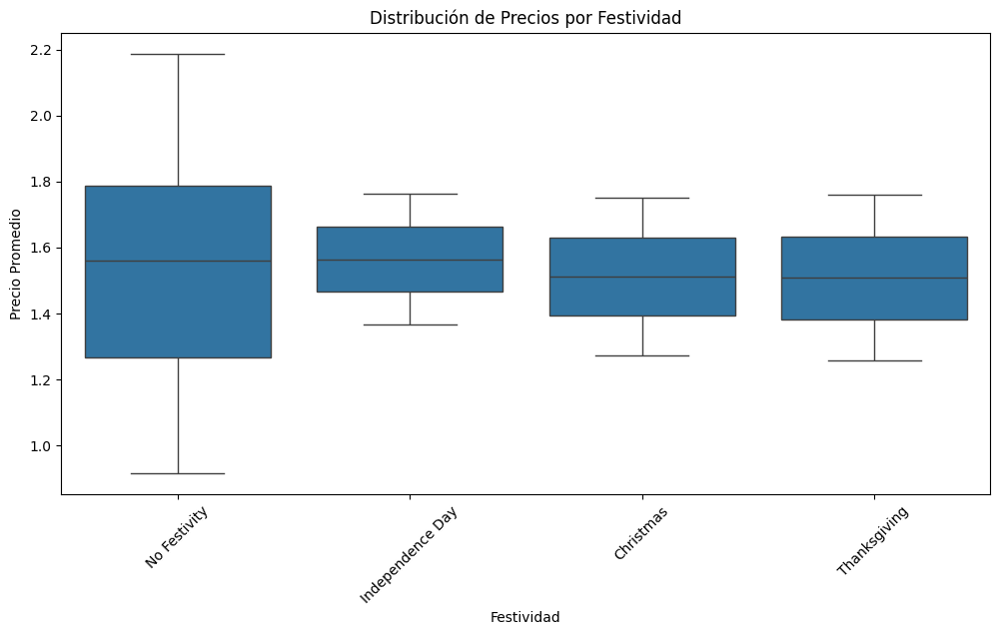

In [86]:
# Gráfico de caja para comparar precios por festividad
plt.figure(figsize=(12, 6))
sns.boxplot(x='Festividad', y='ASP Current Year', data=california_data)
plt.xlabel('Festividad')
plt.ylabel('Precio Promedio')
plt.title('Distribución de Precios por Festividad')
plt.xticks(rotation=45)
plt.show()


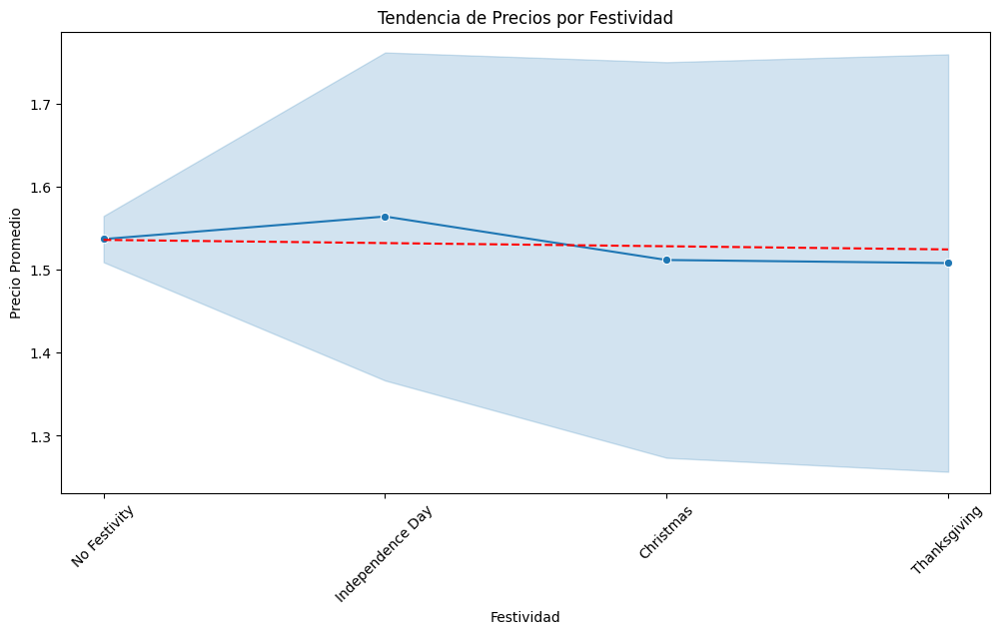

In [91]:
import numpy as np

# Gráfico de líneas con una línea de tendencia
plt.figure(figsize=(12, 6))

# Gráfico de líneas
sns.lineplot(data=california_data, x='Festividad', y='ASP Current Year', marker='o')

# Ajustar una línea de tendencia
z = np.polyfit(range(len(california_data['Festividad'].unique())), 
               california_data.groupby('Festividad')['ASP Current Year'].mean(), 1)
p = np.poly1d(z)
plt.plot(range(len(california_data['Festividad'].unique())), p(range(len(california_data['Festividad'].unique()))), "r--")

plt.xlabel('Festividad')
plt.ylabel('Precio Promedio')
plt.title('Tendencia de Precios por Festividad')
plt.xticks(rotation=45)
plt.show()


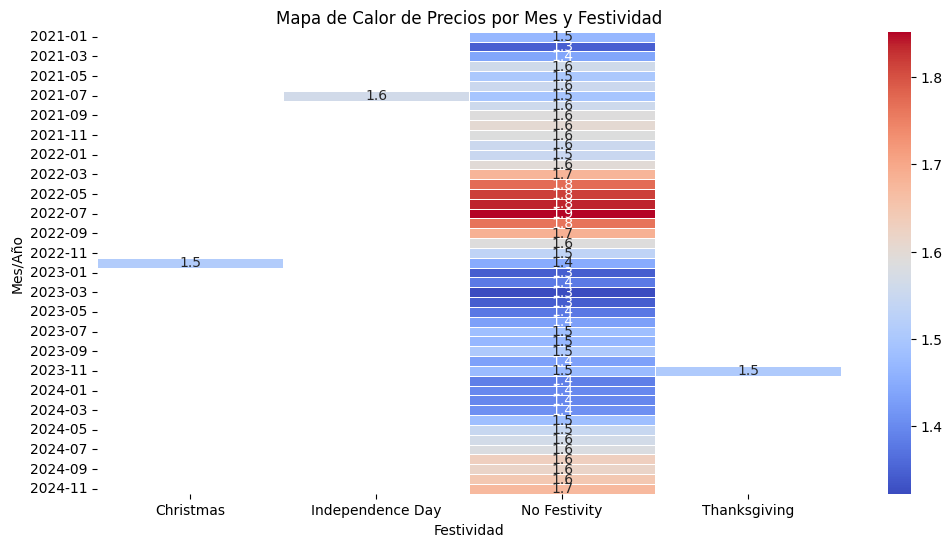

In [92]:
# Crear un índice de fechas para organizar por mes/año
california_data['Fecha'] = pd.to_datetime(california_data['Current Year Week Ending'])
california_data['Mes/Año'] = california_data['Fecha'].dt.to_period('M')

# Pivotar la tabla por mes/año y festividad para obtener la media de precios
heatmap_data = california_data.pivot_table(values='ASP Current Year', 
                                           index='Mes/Año', 
                                           columns='Festividad', 
                                           aggfunc='mean')

# Crear el mapa de calor
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Mapa de Calor de Precios por Mes y Festividad')
plt.show()


In [130]:
# Asegurémonos de que las columnas necesarias existan
print(california_data.columns)

# Si las columnas de unidades y precios están presentes, podemos calcular los porcentajes de cambio.
california_data['Pct_Change_Units'] = california_data['Total Bulk and Bags Units'].pct_change() * 100
california_data['Pct_Change_Price'] = california_data['ASP Current Year'].pct_change() * 100

# Verificamos que las columnas fueron creadas
print(california_data[['Festividad', 'Pct_Change_Units', 'Pct_Change_Price']].head())


Index(['Geography', 'Timeframe', 'Current Year Week Ending', 'Type',
       'ASP Current Year', 'Total Bulk and Bags Units', '4046 Units',
       '4225 Units', '4770 Units', 'TotalBagged Units', 'SmlBagged Units',
       'LrgBagged Units', 'X-LrgBagged Units', 'Quarter', 'Price Cohort',
       'Total Sales', 'Pct_Change_Price', 'Pct_Change_Sales', 'Elasticity',
       'Festividad', 'Mes Contiene Festividad', 'Fecha', 'Mes/Año',
       'Pct_Change_Units', 'Elasticidad'],
      dtype='object')
       Festividad  Pct_Change_Units  Pct_Change_Price
109  No Festivity               NaN               NaN
168  No Festivity       1723.139720        -31.683794
227  No Festivity        -94.244429         46.819857
286  No Festivity       1638.905483        -34.035762
345  No Festivity        -94.084679         47.758372


In [132]:
# Calcular el volumen de ventas por periodo de festividad
volumen_ventas_festividades = festividades_data.groupby(['Festividad', 'Current Year Week Ending'])['Total Bulk and Bags Units'].sum().reset_index()

# Calcular el volumen de ventas promedio antes, durante y después de cada festividad
volumen_promedio_festividades = volumen_ventas_festividades.groupby(['Festividad'])['Total Bulk and Bags Units'].mean().reset_index()

# Ver los primeros resultados para verificar
print(volumen_promedio_festividades.head())


         Festividad  Total Bulk and Bags Units
0         Christmas               2.815731e+07
1  Independence Day               3.168980e+07
2         Labor Day               3.031689e+07
3      Memorial Day               3.119264e+07
4          New Year               3.333823e+07


C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\965373381.py:17: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



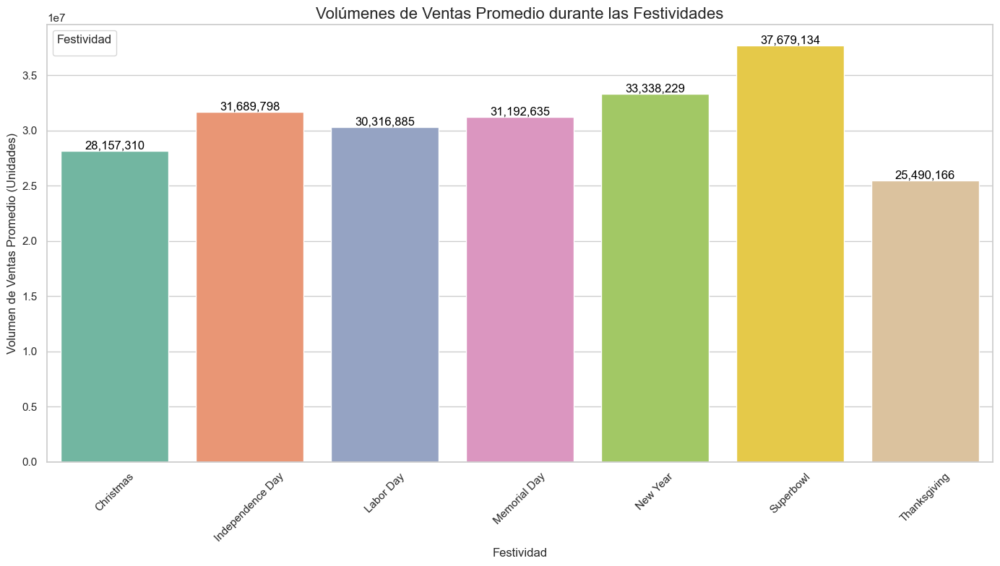

In [137]:
# Visualizar los volúmenes de ventas durante las festividades
plt.figure(figsize=(14, 8))

# Utilizamos 'Festividad' para el 'hue' en lugar de 'Periodo de Festividad'
sns.barplot(data=volumen_promedio_festividades, x='Festividad', y='Total Bulk and Bags Units', hue='Festividad', palette='Set2')

# Agregar etiquetas de los volúmenes de ventas encima de las barras
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height():,.0f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Personalizar el gráfico
plt.title('Volúmenes de Ventas Promedio durante las Festividades', fontsize=16)
plt.xlabel('Festividad', fontsize=12)
plt.ylabel('Volumen de Ventas Promedio (Unidades)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Festividad', loc='upper left')

# Mejorar el diseño del gráfico
plt.tight_layout()

# Mostrar el gráfico
plt.show()




C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\4099367281.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




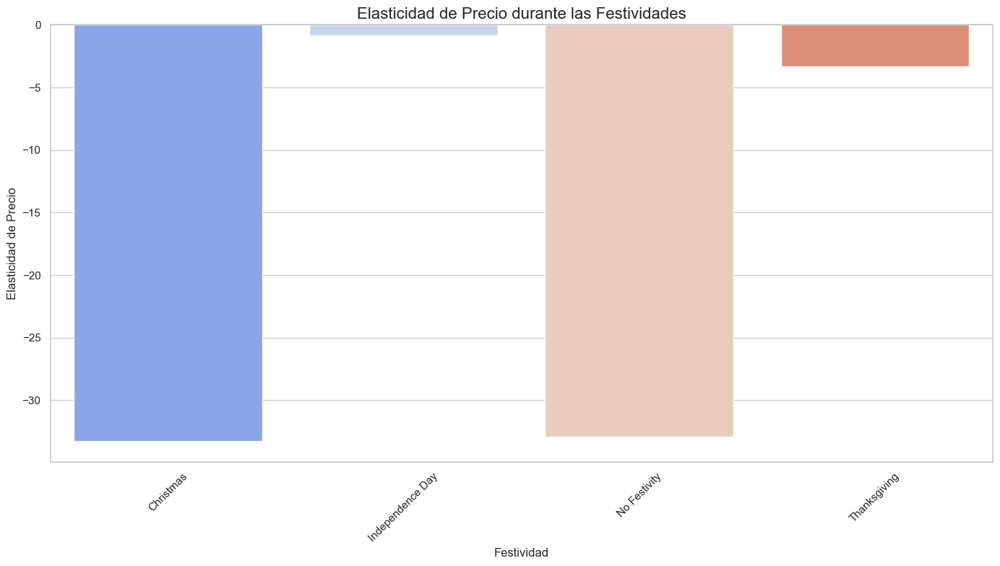

In [153]:
# Calcular elasticidad de precio durante las festividades
california_data['Elasticidad'] = california_data['Pct_Change_Units'] / california_data['Pct_Change_Price']

# Calcular elasticidad promedio por festividad
elasticidad_festividades = california_data.groupby('Festividad')['Elasticidad'].mean().reset_index()

# Visualizar la elasticidad de precio por festividad
plt.figure(figsize=(14, 8))
sns.barplot(data=elasticidad_festividades, x='Festividad', y='Elasticidad', palette='coolwarm')

plt.title('Elasticidad de Precio durante las Festividades', fontsize=16)
plt.xlabel('Festividad', fontsize=12)
plt.ylabel('Elasticidad de Precio', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [166]:
# Asegurémonos de que las fechas están en formato datetime
california_data['Current Year Week Ending'] = pd.to_datetime(california_data['Current Year Week Ending'], errors='coerce')

# Paso 1: Comprobar las semanas disponibles para cada festividad
# Primero agrupamos los datos por festividad y semana, y luego contamos el número de semanas disponibles
semanas_por_festividad = california_data.groupby(['Festividad', 'Current Year Week Ending']).size().reset_index(name='Num_Semanas')

# Paso 2: Ver las festividades y las semanas en las que están disponibles
# Mostramos las festividades y las semanas en las que hay datos
print(semanas_por_festividad)

# Paso 3: Comprobar los valores únicos de 'Festividad' y 'Current Year Week Ending'
# Para ver qué festividades y semanas están presentes
print(california_data[['Festividad', 'Current Year Week Ending']].drop_duplicates().sort_values(by='Current Year Week Ending'))




           Festividad Current Year Week Ending  Num_Semanas
0           Christmas               2022-12-25            2
1    Independence Day               2021-07-04            2
2        No Festivity               2021-01-11            1
3        No Festivity               2021-01-17            2
4        No Festivity               2021-01-24            2
..                ...                      ...          ...
195      No Festivity               2024-10-13            2
196      No Festivity               2024-10-20            2
197      No Festivity               2024-10-27            2
198      No Festivity               2024-11-03            2
199      Thanksgiving               2023-11-26            2

[200 rows x 3 columns]
         Festividad Current Year Week Ending
109    No Festivity               2021-01-11
168    No Festivity               2021-01-17
286    No Festivity               2021-01-24
404    No Festivity               2021-01-31
522    No Festivity            

C:\Users\clarg\AppData\Local\Temp\ipykernel_13408\3439317700.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




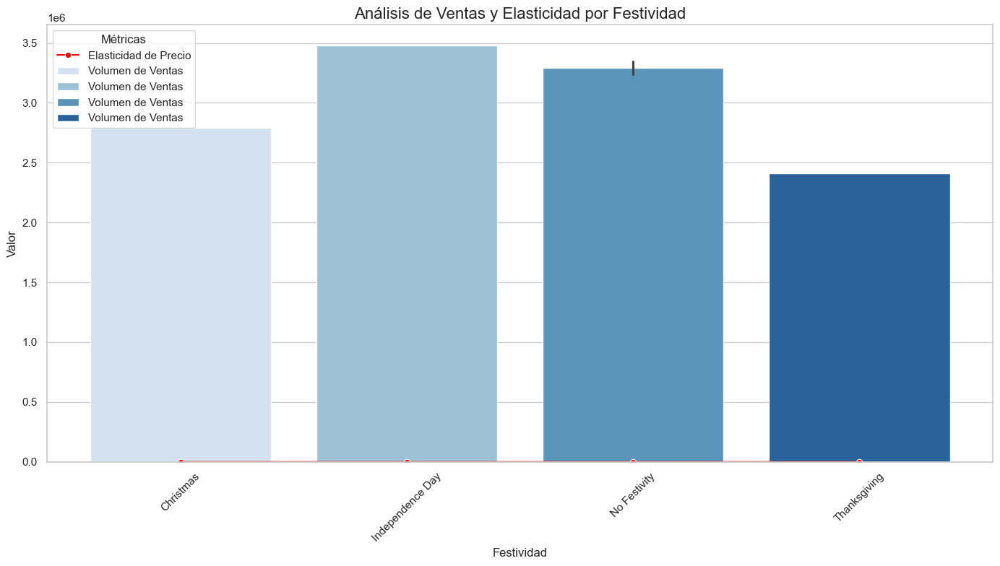

In [154]:
# Unir los datos de volumen promedio, elasticidad y otras métricas clave
analisis_festividades = pd.merge(volumen_promedio_festividades, elasticidad_festividades, on='Festividad')

# Visualizar la información de manera combinada
plt.figure(figsize=(14, 8))
sns.barplot(data=analisis_festividades, x='Festividad', y='Total Bulk and Bags Units', palette='Blues', label='Volumen de Ventas')
sns.lineplot(data=analisis_festividades, x='Festividad', y='Elasticidad', marker='o', color='red', label='Elasticidad de Precio')

# Personalizar el gráfico
plt.title('Análisis de Ventas y Elasticidad por Festividad', fontsize=16)
plt.xlabel('Festividad', fontsize=12)
plt.ylabel('Valor', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Métricas', loc='upper left')

# Mostrar el gráfico
plt.tight_layout()
plt.show()


Conclusiones:

Festividades con mayor volumen de ventas: Estas festividades deben ser una prioridad para las campañas de marketing, ya que son las que generan el mayor retorno en términos de unidades vendidas.

Elasticidad de precio: Las festividades con alta elasticidad deben ser consideradas para aplicar estrategias de precios más flexibles, como descuentos o promociones.
Maximización del ROI: Considera una mayor asignación de presupuesto a aquellas festividades que no solo tengan un alto volumen de ventas, sino también una elasticidad favorable que permita ajustar precios de manera efectiva.